# Import librarires and data

In [1]:
url = 'https://drive.google.com/file/d/1XUWlOkiUtgVB63Xw-VEMpuQUh9ju0rWW/view?usp=sharing'
file_id = url.split('/')[-2]
read_url='https://drive.google.com/uc?id=' + file_id

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.metrics import accuracy_score, classification_report

#importing libraries for machine learning
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from sklearn.decomposition import PCA

In [3]:
df = pd.read_csv(read_url)
df.head()

,sensorId,IP_Address,Packet_Rate,Packet_Drop_Rate,Packet_Duplication_Rate,Data_Throughput,Signal_Strength,SNR,Battery_Level,Energy_Consumption_Rate,...,Route_Request_Frequency,Route_Reply_Frequency,Data_Transmission_Frequency,Data_Reception_Frequency,Error_Rate,CPU_Usage,Memory_Usage,Bandwidth,Pinged_IP,Is_Malicious
0,5001,192.168.193.13,43.156851,2.062473,1.125888,104.615332,-44.797343,13.096425,87.837707,4.345519,...,9.984526,9.771190,13.195053,16.832787,0.117503,43.950881,27.460599,94.519139,10.0.0.5,0
1,5002,192.168.31.79,43.301837,1.039306,0.543653,87.521135,-57.863677,23.172562,70.545493,4.943567,...,8.582927,10.568996,17.261001,17.632394,0.096647,31.554642,27.590241,85.935725,37.223.153.40,0
2,5003,192.168.134.134,89.374541,4.814556,1.117471,33.992990,-41.181198,19.880221,65.091574,10.954954,...,14.345728,12.271464,23.462420,18.875817,0.223306,53.961389,45.886451,88.966717,81.175.184.184,1
3,5004,192.168.252.168,71.867030,1.312661,1.205708,134.559803,-47.913853,20.884248,65.481566,5.176807,...,7.282654,9.863889,16.739802,13.931753,0.101356,47.087714,29.489004,91.074752,130.128.48.218,0
4,5005,192.168.142.235,45.873299,1.959537,1.138048,142.220111,-54.056152,19.700842,79.460238,4.722245,...,11.071245,10.758231,13.716476,12.269483,0.096624,50.945449,32.042872,55.832674,207.88.196.183,0


In [4]:
df.tail()

,sensorId,IP_Address,Packet_Rate,Packet_Drop_Rate,Packet_Duplication_Rate,Data_Throughput,Signal_Strength,SNR,Battery_Level,Energy_Consumption_Rate,...,Route_Request_Frequency,Route_Reply_Frequency,Data_Transmission_Frequency,Data_Reception_Frequency,Error_Rate,CPU_Usage,Memory_Usage,Bandwidth,Pinged_IP,Is_Malicious
4995,3996,192.168.188.45,68.527424,1.806784,1.069609,84.576147,-50.365086,16.575257,81.037736,6.557757,...,9.984938,9.537372,12.640094,16.750872,0.105225,30.764045,27.374333,85.719669,10.0.0.5,0
4996,3997,192.168.212.85,46.677382,2.050346,0.992154,74.526378,-54.655461,16.544211,78.756026,2.279207,...,9.610796,9.743306,12.165926,13.700062,0.070212,58.460948,30.310769,63.268759,212.52.149.252,0
4997,3998,192.168.157.138,30.754663,1.669956,0.990064,118.958239,-46.495147,22.666451,68.212865,4.865092,...,9.532941,7.916710,14.715088,17.893665,0.128069,35.514556,32.926829,86.153456,25.63.108.215,0
4998,3999,192.168.25.14,46.085946,1.608279,0.845962,100.713957,-46.538977,20.891014,86.648035,6.009246,...,10.131550,9.161066,13.334454,16.732972,0.087117,33.393923,33.933248,77.766034,249.156.83.220,0
4999,4000,192.168.14.215,44.076100,2.554082,1.146510,79.949701,-55.804007,14.167573,59.831910,4.334132,...,9.945563,9.402071,13.630934,17.499744,0.087046,49.887565,18.485986,84.472364,192.168.1.1,0


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 21 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   sensorId                     5000 non-null   int64  
 1   IP_Address                   5000 non-null   object 
 2   Packet_Rate                  5000 non-null   float64
 3   Packet_Drop_Rate             5000 non-null   float64
 4   Packet_Duplication_Rate      5000 non-null   float64
 5   Data_Throughput              5000 non-null   float64
 6   Signal_Strength              5000 non-null   float64
 7   SNR                          5000 non-null   float64
 8   Battery_Level                5000 non-null   float64
 9   Energy_Consumption_Rate      5000 non-null   float64
 10  Number_of_Neighbors          5000 non-null   int64  
 11  Route_Request_Frequency      5000 non-null   float64
 12  Route_Reply_Frequency        5000 non-null   float64
 13  Data_Transmission_

In [6]:
feature_names = df.columns

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 21 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   sensorId                     5000 non-null   int64  
 1   IP_Address                   5000 non-null   object 
 2   Packet_Rate                  5000 non-null   float64
 3   Packet_Drop_Rate             5000 non-null   float64
 4   Packet_Duplication_Rate      5000 non-null   float64
 5   Data_Throughput              5000 non-null   float64
 6   Signal_Strength              5000 non-null   float64
 7   SNR                          5000 non-null   float64
 8   Battery_Level                5000 non-null   float64
 9   Energy_Consumption_Rate      5000 non-null   float64
 10  Number_of_Neighbors          5000 non-null   int64  
 11  Route_Request_Frequency      5000 non-null   float64
 12  Route_Reply_Frequency        5000 non-null   float64
 13  Data_Transmission_

# EDA

## Pairplots

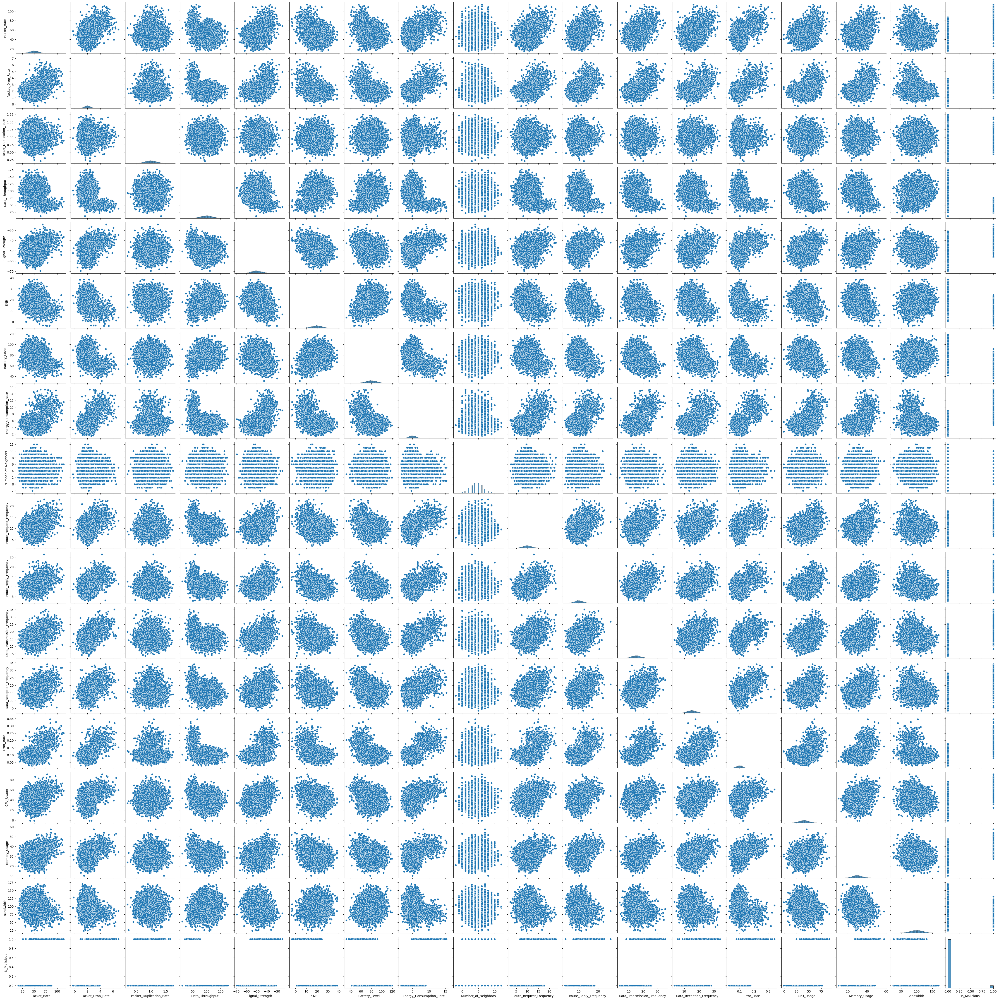

In [ ]:
import seaborn as sns
sns.pairplot(df)

## Outliers

In [ ]:
num_cols = df.select_dtypes(include=['float64', 'int64']).columns.tolist()
print(num_cols)
print(len(num_cols))

['Packet_Rate', 'Packet_Drop_Rate', 'Packet_Duplication_Rate', 'Data_Throughput', 'Signal_Strength', 'SNR', 'Battery_Level', 'Energy_Consumption_Rate', 'Number_of_Neighbors', 'Route_Request_Frequency', 'Route_Reply_Frequency', 'Data_Transmission_Frequency', 'Data_Reception_Frequency', 'Error_Rate', 'CPU_Usage', 'Memory_Usage', 'Bandwidth', 'Is_Malicious']
18


In [ ]:
from warnings import filterwarnings
filterwarnings("ignore")

# Create a custom color palette
colors = sns.color_palette("husl", len(num_cols))

# Create a grid of subplots with 2 rows and 4 columns
fig, axs = plt.subplots(nrows=len(num_cols) // 2, ncols=4, figsize=(20, 15),
                        gridspec_kw={'hspace': 1, 'wspace': 0.3})

# Loop through each numerical column and create a pair of subplots
for i, col in enumerate(num_cols):
    # Compute the row and column indices for the current subplot pair
    row = i // 2
    col_pair = i % 2

    # Create a distplot in the left subplot of the current pair
    sns.distplot(df[col], ax=axs[row, col_pair * 2], color=colors[i])
    axs[row, col_pair * 2].set_title(f'{col} - Distribution Plot')

    # Create a boxplot in the right subplot of the current pair
    sns.boxplot(df[col], ax=axs[row, col_pair * 2 + 1], color=colors[i], orient='h')
    axs[row, col_pair * 2 + 1].set_title(f'{col} - Box Plot')

    # Identify any potential outliers using Tukey's rule
    q1, q3 = df[col].quantile([0.25, 0.75])
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    outlier_percent = len(outliers) / len(df[col]) * 100
    if len(outliers) > 0:
        print(f'{col} has {len(outliers)} potential outliers and they are {outlier_percent:.2f}% of the data')
    else:
        print(f'{col} does not have any potential outliers')

#show the plot
plt.show()

In [ ]:
# Remove outliers based on Tukey's rule
for col in num_cols:
    q1, q3 = df[col].quantile([0.25, 0.75])
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    dfOt = df[(df[col] >= lower_bound) & (df[col] <= upper_bound)]

# Check the shape of the DataFrame after removing outliers
print("DataFrame shape after removing outliers:", dfOt.shape)


In [ ]:
from warnings import filterwarnings
filterwarnings("ignore")

# Create a custom color palette
colors = sns.color_palette("husl", len(num_cols))

# Create a grid of subplots with 2 rows and 4 columns
fig, axs = plt.subplots(nrows=len(num_cols) // 2, ncols=4, figsize=(20, 15),
                        gridspec_kw={'hspace': 1, 'wspace': 0.3})

# Loop through each numerical column and create a pair of subplots
for i, col in enumerate(num_cols):
    # Compute the row and column indices for the current subplot pair
    row = i // 2
    col_pair = i % 2

    # Create a distplot in the left subplot of the current pair
    sns.distplot(dfOt[col], ax=axs[row, col_pair * 2], color=colors[i])
    axs[row, col_pair * 2].set_title(f'{col} - Distribution Plot')

    # Create a boxplot in the right subplot of the current pair
    sns.boxplot(dfOt[col], ax=axs[row, col_pair * 2 + 1], color=colors[i], orient='h')
    axs[row, col_pair * 2 + 1].set_title(f'{col} - Box Plot')

In [ ]:
from warnings import filterwarnings
filterwarnings("ignore")
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from scipy.stats import gaussian_kde
from scipy.integrate import quad

# Select numerical columns
num_cols = df.select_dtypes(include=['float64', 'int64']).columns.tolist()
print(num_cols)
print(len(num_cols))

# Create a custom color palette
colors = sns.color_palette("husl", len(num_cols))

# Calculate the number of rows needed for the subplots
nrows = (len(num_cols) + 3) // 4

# Create a grid of subplots with appropriate number of rows and 4 columns
fig, axs = plt.subplots(nrows=nrows, ncols=4, figsize=(20, 5 * nrows),
                        gridspec_kw={'hspace': 1, 'wspace': 0.3})

# Flatten axs array for easy iteration
axs = axs.flatten()

# Function to calculate overlap between two distributions
def calculate_overlap(data1, data2):
    kde1 = gaussian_kde(data1)
    kde2 = gaussian_kde(data2)
    xmin = min(data1.min(), data2.min())
    xmax = max(data1.max(), data2.max())

    overlap = quad(lambda x: min(kde1(x), kde2(x)), xmin, xmax)[0]
    return overlap * 100  # Convert to percentage

# Loop through each numerical column and create a distribution plot for each
for i, col in enumerate(num_cols):
    # Plot the distribution for data where is_malicious == 0
    sns.kdeplot(df[df['Is_Malicious'] == 0][col], ax=axs[i], label='Not Malicious', color='blue')

    # Plot the distribution for data where is_malicious == 1
    sns.kdeplot(df[df['Is_Malicious'] == 1][col], ax=axs[i], label='Malicious', color='red')

    # Set the title and legend
    axs[i].set_title(f'{col} - Distribution Plot')
    axs[i].legend()

    # Calculate and print the overlap percentage
    overlap_percentage = calculate_overlap(df[df['Is_Malicious'] == 0][col], df[df['Is_Malicious'] == 1][col])
    print(f'{col} - Overlap Percentage: {overlap_percentage:.2f}%')

# Remove any empty subplots
for i in range(len(num_cols), len(axs)):
    fig.delaxes(axs[i])

# Show the plot
plt.show()


## Correlation Analysis

### Correlation

In [ ]:
correlation_matrix = df.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

In [ ]:
correlation_matrixOt = dfOt.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrixOt, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap with no outliers')
plt.show()

### Pearson Correlation


In [ ]:
pearson_corr_matrix = df.corr(method='pearson')
plt.figure(figsize=(12, 10))
sns.heatmap(pearson_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Pearson Correlation Heatmap')
plt.show()

In [ ]:
pearson_corr_matrixOt = dfOt.corr(method='pearson')
plt.figure(figsize=(12, 10))
sns.heatmap(pearson_corr_matrixOt, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Pearson Correlation Heatmap with no outliers')
plt.show()

In [ ]:
# Filter correlation matrix to get correlations between -1 to -0.5 and 0.5 to 1 in one direction only
high_corr = pearson_corr_matrix[((pearson_corr_matrix > 0.5) & (pearson_corr_matrix < 1.0)) | ((pearson_corr_matrix < -0.5) & (pearson_corr_matrix > -1.0))]

# Iterate through the filtered correlation matrix and print correlations and column names
for col1 in high_corr.columns:
    for col2 in high_corr.index:
        corr_value = high_corr.loc[col2, col1]
        if (corr_value > 0.5 and corr_value < 1.0) or (corr_value < -0.5 and corr_value > -1.0):
            print(f"Correlation between '{col1}' and '{col2}': {corr_value}")

In [ ]:
# Filter correlation matrix to get correlations between -1 to -0.5 and 0.5 to 1 in one direction only
high_corrOt = pearson_corr_matrixOt[((pearson_corr_matrixOt > 0.5) & (pearson_corr_matrixOt < 1.0)) | ((pearson_corr_matrixOt < -0.5) & (pearson_corr_matrixOt > -1.0))]

# Iterate through the filtered correlation matrix and print correlations and column names
for col1 in high_corrOt.columns:
    for col2 in high_corrOt.index:
        corr_value = high_corrOt.loc[col2, col1]
        if (corr_value > 0.5 and corr_value < 1.0) or (corr_value < -0.5 and corr_value > -1.0):
            print(f"Correlation between '{col1}' and '{col2}': {corr_value}")

## Missing Value Visualisation

In [ ]:
plt.figure(figsize=(10, 6))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title('Missing Value Heatmap')
plt.show()

No missing values

# Feature Selection

## Dimensionality Reduction

### PCA

Reduces dimensionality by transforming the original features into a lower-dimensional space while retaining as much variance as possible.

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

'Is_malicious' since target variable
'Timestamp' and 'IP_Address' bcoz can't scale in std scaler

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np

# Assuming your dataset is stored in a DataFrame called 'df'

# Drop columns 'Is_Malicious', 'Timestamp', 'IP_Address'
X = df.drop(columns=['Is_Malicious'])

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Define a range of numbers of components
n_components_range = np.arange(1, min(X.shape) + 1)  # to avoid exceeding the number of features

# Initialize lists to store results
explained_variance_ratios = []
cumulative_explained_variance_ratios = []

# Perform PCA with multiple numbers of components
for n_components in n_components_range:
    # Initialize PCA with the current number of components
    pca = PCA(n_components=n_components)

    # Perform PCA
    X_pca = pca.fit_transform(X_scaled)

    # Compute explained variance ratio
    explained_variance_ratio = pca.explained_variance_ratio_

    # Pad the explained variance ratio array with zeros if necessary
    if len(explained_variance_ratio) < len(X.columns):
        explained_variance_ratio = np.pad(explained_variance_ratio, (0, len(X.columns) - len(explained_variance_ratio)), 'constant')

    explained_variance_ratios.append(explained_variance_ratio)

    # Compute cumulative explained variance ratio
    cumulative_explained_variance_ratios.append(np.sum(explained_variance_ratio))

# Convert lists to arrays for easier manipulation
explained_variance_ratios = np.array(explained_variance_ratios)
cumulative_explained_variance_ratios = np.array(cumulative_explained_variance_ratios)

# Print explained variance ratios and cumulative explained variance ratios for each number of components
for i, n_components in enumerate(n_components_range):
    print(f"Number of components: {n_components}")
    print(f"Explained variance ratio: {explained_variance_ratios[i]}")
    print(f"Cumulative explained variance ratio: {cumulative_explained_variance_ratios[i]}")
    print()

# Plot explained variance ratio and cumulative explained variance ratio
plt.figure(figsize=(10, 6))
plt.plot(n_components_range, cumulative_explained_variance_ratios, marker='o', linestyle='-')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Cumulative Explained Variance Ratio vs. Number of Components')
plt.xticks(n_components_range)
plt.grid(True)
plt.show()


In [ ]:
X = df.drop(columns=['Is_Malicious'])
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
n_components = 9
pca = PCA(n_components=n_components)
X_pca = pca.fit_transform(X_scaled)
columns = [f"PC{i+1}" for i in range(n_components)]
df_pca = pd.DataFrame(data=X_pca, columns=columns)
df_final = df_pca
print("Explained variance ratio:", pca.explained_variance_ratio_)
print("Cumulative explained variance ratio:", pca.explained_variance_ratio_.cumsum())
print(df_final.head())

In [ ]:
pca = PCA()
pca.fit(X)

# Get the loadings (correlation coefficients) for each feature and each principal component
loadings = pca.components_

# Calculate the absolute values of loadings
abs_loadings = np.abs(loadings)

# Plot variable importance for each principal component
plt.figure(figsize=(10, 6))
for i in range(abs_loadings.shape[0]):
    plt.plot(range(len(X.columns)), abs_loadings[i], marker='o', label=f"PC{i+1}")
plt.xticks(range(len(X.columns)), X.columns, rotation=90)
plt.xlabel('Original Features')
plt.ylabel('Absolute Loadings')
plt.title('Variable Importance for Each Principal Component')
plt.legend()
plt.show()

### t-SNE

Non-linear dimensionality reduction technique useful for visualization.

In [ ]:
from sklearn.manifold import TSNE

#### 2D Plot

In [ ]:
num_random_states = 5
n_components = 2

In [ ]:
tsne_models = []
for i in range(num_random_states):
    tsne_models.append(TSNE(n_components=n_components, random_state=i))


In [ ]:
embeddings = []
for model in tsne_models:
    embeddings.append(model.fit_transform(X))

In [ ]:
plt.figure(figsize=(15, 10))
for i, embedding in enumerate(embeddings):
    plt.subplot(2, 3, i + 1)  # Adjust the subplot layout based on the number of random states
    plt.scatter(embedding[:, 0], embedding[:, 1], alpha=0.5)
    plt.title(f"Random State {i}")
    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')
    plt.grid(True)

plt.tight_layout()
plt.show()

Multiple plots to check stability

In [ ]:
tsne = TSNE(n_components=2, random_state=42)

X_tsne = tsne.fit_transform(X)

plt.figure(figsize=(10, 6))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], alpha=0.5)
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.title('t-SNE Visualization')
plt.grid(True)
plt.show()

#### 3D Plot

In [ ]:
num_random_states = 5
n_components = 3

In [ ]:
tsne_models = []
for i in range(num_random_states):
    tsne_models.append(TSNE(n_components=n_components, random_state=i))

In [ ]:
embeddings = []
for model in tsne_models:
    embeddings.append(model.fit_transform(X))

In [ ]:
plt.figure(figsize=(15, 10))
for i, embedding in enumerate(embeddings):
        ax = plt.subplot(2, 3, i + 1, projection='3d')  # Adjust the subplot layout based on the number of random states
        ax.scatter(embedding[:, 0], embedding[:, 1], embedding[:, 2], alpha=0.5)
        ax.set_title(f"Random State {i}")
        ax.set_xlabel('t-SNE Component 1')
        ax.set_ylabel('t-SNE Component 2')
        ax.set_zlabel('t-SNE Component 3')
        ax.grid(True)

plt.tight_layout()
plt.show()

In [ ]:
tsne = TSNE(n_components=3, random_state=42)

X_tsne = tsne.fit_transform(X)

fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')

ax.scatter(X_tsne[:, 0], X_tsne[:, 1], X_tsne[:, 2], alpha=0.5)
ax.set_xlabel('t-SNE Component 1')
ax.set_ylabel('t-SNE Component 2')
ax.set_zlabel('t-SNE Component 3')
ax.set_title('t-SNE Visualization')
ax.grid(True)

plt.show()

## Univariate Feature Selection

In [ ]:
from sklearn.feature_selection import SelectKBest, SelectPercentile
from sklearn.feature_selection import f_classif, chi2

In [ ]:
y = df['Is_Malicious']

### SelectKBest

In [ ]:
k_best = SelectKBest(score_func=f_classif, k=5)
X_kbest = k_best.fit_transform(X, y)
k_best_indices = np.where(k_best.get_support())[0]

In [ ]:
selected_features_kbest = [feature_names[i] for i in k_best_indices]
print("Selected features using SelectKBest:", selected_features_kbest)

### SelectPercentile

In [ ]:
X_non_negative = X - np.min(X) + 1e-6
percentile = SelectPercentile(score_func=chi2, percentile=25)
X_percentile = percentile.fit_transform(X_non_negative, y)
percentile_indices = np.where(percentile.get_support())[0]

In [ ]:
selected_features_percentile = feature_names[percentile_indices]
print("Selected features using SelectPercentile:", selected_features_percentile)

## Correlation-based Feature Selection

In [ ]:
correlation_with_target = correlation_matrix.iloc[:-1, -1].abs()


In [ ]:
correlation_with_target_sorted = correlation_with_target.sort_values(ascending=False)

In [ ]:
k = 5
selected_features_correlation = correlation_with_target_sorted.head(k).index.tolist()

In [ ]:
print("Selected features based on correlation with the target variable:")
print(selected_features_correlation)

## Pearson Correlation-based Feature Selection

In [ ]:
Pcorrelation_with_target = pearson_corr_matrix.iloc[:-1, -1].abs()

In [ ]:
Pcorrelation_with_target_sorted = Pcorrelation_with_target.sort_values(ascending=False)

In [ ]:
k = 5
selected_features_Pcorrelation = Pcorrelation_with_target_sorted.head(k).index.tolist()

In [ ]:
print("Selected features based on pearson correlation with the target variable:")
print(selected_features_Pcorrelation)

## Elastic Net

ElasticNet is a linear regression model that combines L1 (Lasso) and L2 (Ridge) regularization penalties.

In [ ]:
from sklearn.linear_model import ElasticNet
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
elasticnet = ElasticNet(alpha=0.1, l1_ratio=0.5, random_state=42)

In [ ]:
elasticnet.fit(X_train_scaled, y_train)

In [ ]:
y_pred = elasticnet.predict(X_test_scaled)

In [ ]:
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error (MSE):", mse)
print("Coefficients:", elasticnet.coef_)

In [ ]:
threshold = 0.05
selected_features_elasticNet = X.columns[np.abs(elasticnet.coef_) > threshold]

In [ ]:
print("Selected features based on coefficients:")
print(selected_features_elasticNet)

## Wrapper Methods

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.datasets import make_regression

In [ ]:
model = LinearRegression()

In [ ]:
num_features_to_select = 5

### Recursive Feature Elimination (RFE)

Recursive Feature Elimination (RFE) is a feature selection technique that recursively removes the least important features until the specified number of features is reached.

In [ ]:
from sklearn.feature_selection import RFE

In [ ]:
rfe = RFE(estimator=model, n_features_to_select=num_features_to_select)

rfe.fit(X, y)

selected_features_rfe = X.columns[rfe.support_]

In [ ]:
print("Selected features:")
print(selected_features_rfe)

### Forward Selection

Forward selection is a feature selection technique that starts with an empty set of features and adds one feature at a time, selecting the feature that improves the model's performance the most.

In [ ]:
from sklearn.feature_selection import SequentialFeatureSelector

In [ ]:

sfs = SequentialFeatureSelector(estimator=model, n_features_to_select=num_features_to_select,
                                direction='forward', scoring='r2')

sfs.fit(X, y)

selected_features_fwd = X.columns[sfs.get_support()]

In [ ]:
print("Selected features:")
print(selected_features_fwd)

### Backward Elimination

Backward selection is a feature selection technique that starts with the full set of features and removes one feature at a time, selecting the feature whose removal improves the model's performance the least.

In [ ]:
from sklearn.feature_selection import SequentialFeatureSelector

In [ ]:
sfs = SequentialFeatureSelector(estimator=model, n_features_to_select=num_features_to_select,
                                direction='backward', scoring='r2')

sfs.fit(X, y)

selected_features_bkd = X.columns[sfs.get_support()]

In [ ]:
print("Selected features:")
print(selected_features_bkd)

## Tree-based

In [ ]:
from sklearn.datasets import make_classification, make_regression

In [ ]:
y = df['Is_Malicious']

### Decision Tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor

In [ ]:
clf = DecisionTreeClassifier()

In [ ]:
clf.fit(X, y)

feature_importances = clf.feature_importances_

In [ ]:
threshold = 0.05
selected_features = X.columns[feature_importances > threshold]

In [ ]:
print("Selected features based on importance scores:")
print(selected_features)

### Random Forest

In [ ]:
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X, y)
feature_importances = clf.feature_importances_

In [ ]:
threshold = 0.05
selected_features_rf = X.columns[feature_importances > threshold]

In [ ]:
print("Selected features based on importance scores:")
print(selected_features_rf)

### Gradient Boosting

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier, GradientBoostingRegressor

In [ ]:
clf = GradientBoostingClassifier(n_estimators=100, random_state=42)
clf.fit(X, y)
feature_importances = clf.feature_importances_

In [ ]:
threshold = 0.05
selected_features_gb = X.columns[feature_importances > threshold]

In [ ]:
print("Selected features based on importance scores:")
print(selected_features_gb)

### XGBoost

In [ ]:
import xgboost as xgb
from sklearn.model_selection import train_test_split

In [ ]:
dtrain = xgb.DMatrix(X, label=y)

In [ ]:
params = {
    'objective': 'binary:logistic',
    'eval_metric': 'logloss',
    'seed': 42
}

In [ ]:
num_boost_round = 100
bst = xgb.train(params, dtrain, num_boost_round)

In [ ]:
importance = bst.get_score(importance_type='weight')


In [ ]:
threshold = 0.05
selected_features_xgb = [feat for feat, score in importance.items() if score > threshold]


In [ ]:
print("Selected features based on importance scores:")
print(selected_features_xgb)

## Results

In [ ]:
feature_selection_results = {
    'Select K Best': selected_features_kbest,
    'Select Percentile': selected_features_percentile,
    'Correlation Based': selected_features_correlation,
    'Pearson Correlation': selected_features_Pcorrelation,
    'Elastic Net': selected_features_elasticNet,
    'Recursive Feature Elimination': selected_features_rfe,
    'Forward Selection': selected_features_fwd,
    'Backward Elimination': selected_features_bkd,
    'Random Forest': selected_features_rf,
    'Gradient Boosting': selected_features_gb,
    'XGBoost': selected_features_xgb,
    'Manual': ['Packet_Drop_Rate', 'Energy_Consumption_Rate', 'Error_Rate']
}

# Display
print(feature_selection_results)

# Wilcoxon Signed Rank Test

In [ ]:
import pandas as pd
from scipy.stats import wilcoxon

In [ ]:
df_copy = df.copy()

In [ ]:
feature_columns = df_copy.drop(columns=['Is_Malicious'])

In [ ]:
wilcoxon_results = pd.DataFrame(columns=['Feature', 'Statistic', 'P-value'])

In [ ]:
for column in feature_columns:
    # Perform Wilcoxon Signed Rank Test
    statistic, p_value = wilcoxon(df_copy[column], df_copy['Is_Malicious'])

    # Append results to DataFrame
    wilcoxon_results = pd.concat([wilcoxon_results, pd.DataFrame({'Feature': [column], 'Statistic': [statistic], 'P-value': [p_value]})], ignore_index=True)

In [ ]:
alpha = 0.05  # Significance level

wilcoxon_results['Significance'] = wilcoxon_results['P-value'].apply(lambda x: 'Significant' if x < alpha else 'Not Significant')

print("Wilcoxon Signed Rank Test Results:")
print(wilcoxon_results)

In [ ]:
plt.figure(figsize=(10, 6))
plt.bar(wilcoxon_results['Feature'], wilcoxon_results['P-value'], color=wilcoxon_results['Significance'].map({'Significant': 'red', 'Not Significant': 'blue'}))
plt.xlabel('Feature')
plt.ylabel('P-value')
plt.title('P-values of Wilcoxon Signed Rank Test for Each Feature')
plt.xticks(rotation=45, ha='right')
plt.axhline(y=alpha, color='r', linestyle='--', label='Significance Level')
plt.legend()
plt.tight_layout()
plt.show()

# Stats Test - ANOVA

In [ ]:
numerical_features = df.select_dtypes(include=['float64', 'int64']).columns.tolist()
numerical_features.remove('Is_Malicious')  # Remove target variable
numerical_X = df[numerical_features]
numerical_y = df['Is_Malicious']

In [ ]:
anova_f_values, _ = f_classif(numerical_X, numerical_y)

In [ ]:
categorical_features = df.select_dtypes(include=['object']).columns.tolist()
categorical_X = df[categorical_features]
categorical_y = df['Is_Malicious']

In [ ]:
# Convert non-numeric columns to numeric format
numeric_df = df.apply(pd.to_numeric, errors='coerce')

# Initialize an empty dictionary to store the test statistics and p-values for each feature
wilcoxon_results = {}

# Assuming 'Is_Malicious' is the target variable
target_variable = 'Is_Malicious'

# Iterate over each column (excluding the target variable)
for column in numeric_df.columns:
    if column != target_variable:
        # Perform Wilcoxon signed-rank test
        statistic, p_value = wilcoxon(numeric_df[column], numeric_df[target_variable])

        # Store the results in the dictionary
        wilcoxon_results[column] = {'statistic': statistic, 'p_value': p_value}

# Convert the dictionary to a DataFrame for easier visualization
wilcoxon_results_df = pd.DataFrame.from_dict(wilcoxon_results, orient='index')

# Print the results
print(wilcoxon_results_df)


In [ ]:
print(anova_f_values)

In [ ]:
threshold_values = [4731.38437
                ]  # Thresholds to consider

# Print the features with ANOVA F-values above the thresholds
for threshold in threshold_values:
    print(f"Features with ANOVA F-value greater than {threshold}:")
    for feature, f_value in zip(numerical_X.columns, anova_f_values):
        if f_value > threshold:
            print(f"{feature}")

# Machine Learning



## Initial

In [8]:
import time
import pandas as pd
import plotly.express as px
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.preprocessing import MinMaxScaler

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


In [9]:
y = df['Is_Malicious']
X = df[['Signal_Strength','Energy_Consumption_Rate','Number_of_Neighbors','Route_Request_Frequency','Data_Reception_Frequency']]

In [10]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [11]:
print(set(y_train))

{0, 1}


In [12]:
rf_classifier = RandomForestClassifier(random_state=42, n_estimators=10)
xgb_classifier = XGBClassifier(random_state=42)
lgbm_classifier = LGBMClassifier(random_state=42)
extra_trees_classifier = ExtraTreesClassifier(random_state=42)
gradient_boosting_classifier = GradientBoostingClassifier(random_state=42)

In [13]:
scaler = MinMaxScaler()

In [14]:
metrics_df = pd.DataFrame(columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1-score', 'ROC AUC', 'Training Time', 'Prediction Time'])

In [15]:
# Apply Min-Max scaling to training and testing datasets for current feature selection method
X_train_selected_scaled = scaler.fit_transform(X_train)
X_test_selected_scaled = scaler.transform(X_test)

In [16]:
# Loop through classifiers
classifiers = {
    'Random Forest': rf_classifier,
    'XGBoost': xgb_classifier,
    'LightGBM': lgbm_classifier,
    'Extra Trees': extra_trees_classifier,
    'Gradient Boosting': gradient_boosting_classifier
}

In [17]:
# Loop through classifiers
for model_name, classifier in classifiers.items():
    start_time = time.time()
    classifier.fit(X_train_selected_scaled, y_train)
    training_time = time.time() - start_time

    start_time = time.time()
    predictions = classifier.predict(X_test_selected_scaled)
    prediction_time = time.time() - start_time

    accuracy = accuracy_score(y_test, predictions)
    precision = precision_score(y_test, predictions)
    recall = recall_score(y_test, predictions)
    f1 = f1_score(y_test, predictions)
    roc_auc = roc_auc_score(y_test, predictions)

    # Construct a DataFrame with the current metrics
    metrics_row = pd.DataFrame({
        'Model': [model_name],
        'Accuracy': [accuracy],
        'Precision': [precision],
        'Recall': [recall],
        'F1-score': [f1],
        'ROC AUC': [roc_auc],
        'Training Time': [training_time],
        'Prediction Time': [prediction_time]
    })

    # Concatenate the current metrics with the main metrics DataFrame
    metrics_df = pd.concat([metrics_df, metrics_row], ignore_index=True)


<ipython-input-17-3bca0c68f9f4>:30: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  metrics_df = pd.concat([metrics_df, metrics_row], ignore_index=True)


[LightGBM] [Info] Number of positive: 190, number of negative: 3810
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000563 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1033
[LightGBM] [Info] Number of data points in the train set: 4000, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.047500 -> initscore=-2.998360
[LightGBM] [Info] Start training from score -2.998360
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

In [18]:
print(metrics_df)

               Model  Accuracy  Precision    Recall  F1-score   ROC AUC  \
0      Random Forest     0.990        1.0  0.811321  0.895833  0.905660   
1            XGBoost     0.994        1.0  0.886792  0.940000  0.943396   
2           LightGBM     0.992        1.0  0.849057  0.918367  0.924528   
3        Extra Trees     0.993        1.0  0.867925  0.929293  0.933962   
4  Gradient Boosting     0.990        1.0  0.811321  0.895833  0.905660   

   Training Time  Prediction Time  
0       0.349092         0.011684  
1       1.075288         0.031849  
2       0.588008         0.055552  
3       1.503642         0.055695  
4       1.472784         0.004644  


In [19]:
def resample_data(df, class_column):
    # Determine the target count for resampling (e.g., the max count)
    class_counts = df[class_column].value_counts()
    target_count = max(class_counts.max(), class_counts.min())  # Max count for balancing

    # List to store the resampled data
    resampled_dfs = []

    for class_value, count in class_counts.items():
        class_df = df[df[class_column] == class_value]

        if count < target_count:
            # Oversample minority classes
            resampled_df = resample(class_df,
                                    replace=True,     # Sample with replacement
                                    n_samples=target_count,  # Match target count
                                    random_state=42)
        elif count > target_count:
            # Undersample majority classes
            resampled_df = resample(class_df,
                                    replace=False,    # Sample without replacement
                                    n_samples=target_count,  # Match target count
                                    random_state=42)
        else:
            # No resampling needed
            resampled_df = class_df

        resampled_dfs.append(resampled_df)

    # Combine all resampled dataframes into a single dataframe
    resampled_df = pd.concat(resampled_dfs)

    return resampled_df


In [20]:
from sklearn.utils import resample

def resample_data(df, class_column):
    # Determine the target count based on the chosen strategy
    class_counts = df[class_column].value_counts()
    majority_class = class_counts.max()
    minority_class = class_counts.min()

    target_count = (majority_class + minority_class) // 2  # Target count for balancing

    # List to store the resampled data
    resampled_dfs = []

    for class_value, count in class_counts.items():
        class_df = df[df[class_column] == class_value]

        if count < target_count:
            # Oversample minority classes
            resampled_df = resample(class_df,
                                    replace=True,     # Sample with replacement
                                    n_samples=target_count,  # Match target count
                                    random_state=42)
        elif count > target_count:
            # Undersample majority classes
            resampled_df = resample(class_df,
                                    replace=False,    # Sample without replacement
                                    n_samples=target_count,  # Match target count
                                    random_state=42)
        else:
            # No resampling needed
            resampled_df = class_df

        resampled_dfs.append(resampled_df)

    # Combine all resampled dataframes into a single dataframe
    resampled_df = pd.concat(resampled_dfs)

    return resampled_df


In [21]:
from sklearn.utils import resample
res_df = resample_data(df, 'Is_Malicious')

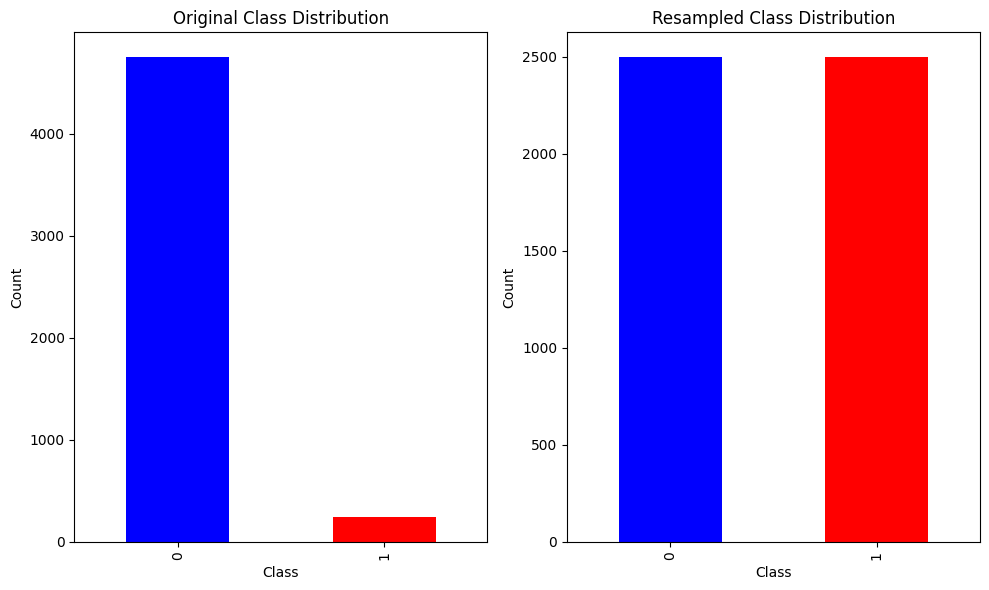

In [22]:
# prompt: i have 2 dataframes- df and res_df. res_df has data that has been resampled from df. I want to compare changes via a visualisation

import matplotlib.pyplot as plt

# Assuming 'Is_Malicious' is your target variable
target_variable = 'Is_Malicious'

# Count the class distribution before and after resampling
original_counts = df[target_variable].value_counts()
resampled_counts = res_df[target_variable].value_counts()

# Create a bar plot to compare
plt.figure(figsize=(10, 6))

plt.subplot(1, 2, 1)
original_counts.plot(kind='bar', color=['blue', 'red'])
plt.title('Original Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')

plt.subplot(1, 2, 2)
resampled_counts.plot(kind='bar', color=['blue', 'red'])
plt.title('Resampled Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')

plt.tight_layout()
plt.show()


In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 21 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   sensorId                     5000 non-null   int64  
 1   IP_Address                   5000 non-null   object 
 2   Packet_Rate                  5000 non-null   float64
 3   Packet_Drop_Rate             5000 non-null   float64
 4   Packet_Duplication_Rate      5000 non-null   float64
 5   Data_Throughput              5000 non-null   float64
 6   Signal_Strength              5000 non-null   float64
 7   SNR                          5000 non-null   float64
 8   Battery_Level                5000 non-null   float64
 9   Energy_Consumption_Rate      5000 non-null   float64
 10  Number_of_Neighbors          5000 non-null   int64  
 11  Route_Request_Frequency      5000 non-null   float64
 12  Route_Reply_Frequency        5000 non-null   float64
 13  Data_Transmission_

{0, 1}


<ipython-input-33-2259ba253440>:74: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  metrics_df = pd.concat([metrics_df, metrics_row], ignore_index=True)


[LightGBM] [Info] Number of positive: 190, number of negative: 3810
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000288 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1033
[LightGBM] [Info] Number of data points in the train set: 4000, number of used features: 5
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.047500 -> initscore=-2.998360
[LightGBM] [Info] Start training from score -2.998360
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

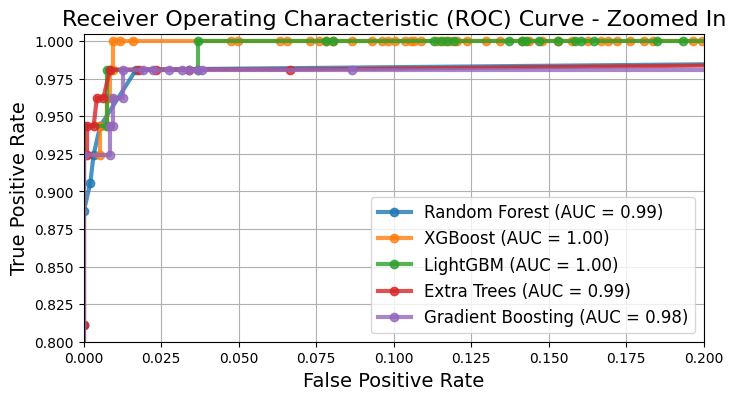

In [33]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
import time
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve
from sklearn.preprocessing import MinMaxScaler

# Assuming df is already defined
y = df['Is_Malicious']
X = df[['Signal_Strength','Energy_Consumption_Rate','Number_of_Neighbors','Route_Request_Frequency','Data_Reception_Frequency']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(set(y_train))
rf_classifier = RandomForestClassifier(random_state=42, n_estimators=10)
xgb_classifier = XGBClassifier(random_state=42)
lgbm_classifier = LGBMClassifier(random_state=42)
extra_trees_classifier = ExtraTreesClassifier(random_state=42)
gradient_boosting_classifier = GradientBoostingClassifier(random_state=42)
scaler = MinMaxScaler()
metrics_df = pd.DataFrame(columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1-score', 'ROC AUC', 'Training Time', 'Prediction Time'])

# Apply Min-Max scaling to training and testing datasets
X_train_selected_scaled = scaler.fit_transform(X_train)
X_test_selected_scaled = scaler.transform(X_test)

classifiers = {
    'Random Forest': rf_classifier,
    'XGBoost': xgb_classifier,
    'LightGBM': lgbm_classifier,
    'Extra Trees': extra_trees_classifier,
    'Gradient Boosting': gradient_boosting_classifier
}


plt.figure(figsize=(8, 4))  # Larger figure size for better clarity

for model_name, classifier in classifiers.items():
    start_time = time.time()
    classifier.fit(X_train_selected_scaled, y_train)
    training_time = time.time() - start_time

    start_time = time.time()
    probabilities = classifier.predict_proba(X_test_selected_scaled)[:, 1]  # Get probabilities for the positive class
    prediction_time = time.time() - start_time

    # Compute ROC curve and ROC AUC
    fpr, tpr, _ = roc_curve(y_test, probabilities)
    roc_auc = auc(fpr, tpr)

    # Calculate metrics
    predictions = (probabilities > 0.5).astype(int)
    accuracy = accuracy_score(y_test, predictions)
    precision = precision_score(y_test, predictions)
    recall = recall_score(y_test, predictions)
    f1 = f1_score(y_test, predictions)

    # Construct a DataFrame with the current metrics
    metrics_row = pd.DataFrame({
        'Model': [model_name],
        'Accuracy': [accuracy],
        'Precision': [precision],
        'Recall': [recall],
        'F1-score': [f1],
        'ROC AUC': [roc_auc],
        'Training Time': [training_time],
        'Prediction Time': [prediction_time]
    })

    metrics_df = pd.concat([metrics_df, metrics_row], ignore_index=True)

    # Plot ROC curve
    plt.plot(fpr, tpr, lw=3, label=f'{model_name} (AUC = {roc_auc:.2f})', marker='o', alpha=0.8)  # Increased line width, added marker, and set transparency

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 0.2])  # Zoom in on False Positive Rate
plt.ylim([0.8, 1.005])  # Zoom in on True Positive Rate
plt.xlabel('False Positive Rate', fontsize=14)  # Increased font size
plt.ylabel('True Positive Rate', fontsize=14)  # Increased font size
plt.title('Receiver Operating Characteristic (ROC) Curve - Zoomed In', fontsize=16)  # Increased font size
plt.legend(loc='lower right', fontsize=12)  # Increased font size
plt.grid(True)
plt.show()



## Training

In [ ]:
    # Apply Min-Max scaling to training and testing datasets for current feature selection method
    X_train_selected_scaled = scaler.fit_transform(X_train)
    X_test_selected_scaled = scaler.transform(X_test)

    # Loop through classifiers
    classifiers = {
        'Random Forest': rf_classifier,
        'XGBoost': xgb_classifier,
        'LightGBM': lgbm_classifier,
        'Extra Trees': extra_trees_classifier,
        'Gradient Boosting': gradient_boosting_classifier
    }

    # Loop through classifiers
    for model_name, classifier in classifiers.items():
        start_time = time.time()
        classifier.fit(X_train_selected_scaled, y_train)
        training_time = time.time() - start_time

        start_time = time.time()
        predictions = classifier.predict(X_test_selected_scaled)
        prediction_time = time.time() - start_time

        accuracy = accuracy_score(y_test, predictions)
        precision = precision_score(y_test, predictions)
        recall = recall_score(y_test, predictions)
        f1 = f1_score(y_test, predictions)
        roc_auc = roc_auc_score(y_test, predictions)

        # Construct a DataFrame with the current metrics
        metrics_row = pd.DataFrame({
            'Method': [method],
            'Model': [model_name],
            'Accuracy': [accuracy],
            'Precision': [precision],
            'Recall': [recall],
            'F1-score': [f1],
            'ROC AUC': [roc_auc],
            'Training Time': [training_time],
            'Prediction Time': [prediction_time]
        })

        # Concatenate the current metrics with the main metrics DataFrame
        metrics_df = pd.concat([metrics_df, metrics_row], ignore_index=True)

    print("--------------------------")

print(metrics_df)

## Bagging Boosting

In [ ]:
from sklearn.ensemble import BaggingClassifier, AdaBoostClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
import time

# Define the classifiers
classifiers = {
    'Random Forest': rf_classifier,
    'XGBoost': xgb_classifier,
    'LightGBM': lgbm_classifier,
    'Extra Trees': extra_trees_classifier,
    'Gradient Boosting': gradient_boosting_classifier
}

# Initialize bagging and boosting classifiers
bagging_classifiers = {name: BaggingClassifier(base_estimator=clf, n_estimators=10, random_state=42) for name, clf in classifiers.items()}
boosting_classifiers = {name: AdaBoostClassifier(base_estimator=clf, n_estimators=10, random_state=42) for name, clf in classifiers.items()}

# Loop through feature selection methods
for method, selected_features in feature_selection_results.items():
    print(f"Using feature selection method: {method}")

    # Apply Min-Max scaling to training and testing datasets for current feature selection method
    X_train_selected_scaled = scaler.fit_transform(X_train[selected_features])
    X_test_selected_scaled = scaler.transform(X_test[selected_features])

    # Loop through bagging classifiers
    for model_name, classifier in bagging_classifiers.items():
        start_time = time.time()
        classifier.fit(X_train_selected_scaled, y_train)
        training_time = time.time() - start_time

        start_time = time.time()
        predictions = classifier.predict(X_test_selected_scaled)
        prediction_time = time.time() - start_time

        accuracy = accuracy_score(y_test, predictions)
        precision = precision_score(y_test, predictions)
        recall = recall_score(y_test, predictions)
        f1 = f1_score(y_test, predictions)
        roc_auc = roc_auc_score(y_test, predictions)

        # Add metrics to DataFrame
        new_row = {
            'Method': method,
            'Model': f'Bagging {model_name}',
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1-score': f1,
            'ROC AUC': roc_auc,
            'Training Time': training_time,
            'Prediction Time': prediction_time
        }
        metrics_df = pd.concat([metrics_df, pd.DataFrame([new_row])], ignore_index=True)

    # Loop through boosting classifiers
    for model_name, classifier in boosting_classifiers.items():
        start_time = time.time()
        classifier.fit(X_train_selected_scaled, y_train)
        training_time = time.time() - start_time

        start_time = time.time()
        predictions = classifier.predict(X_test_selected_scaled)
        prediction_time = time.time() - start_time

        accuracy = accuracy_score(y_test, predictions)
        precision = precision_score(y_test, predictions)
        recall = recall_score(y_test, predictions)
        f1 = f1_score(y_test, predictions)
        roc_auc = roc_auc_score(y_test, predictions)

        # Add metrics to DataFrame
        new_row = {
            'Method': method,
            'Model': f'Boosting {model_name}',
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1-score': f1,
            'ROC AUC': roc_auc,
            'Training Time': training_time,
            'Prediction Time': prediction_time
        }
        metrics_df = pd.concat([metrics_df, pd.DataFrame([new_row])], ignore_index=True)

    print("--------------------------")

# Print the DataFrame with all metrics
print(metrics_df)


In [ ]:
metrics_df.to_csv('metrics.csv', index=False)

In [ ]:
# Assuming your target variable is named 'target'
class_distribution = df['Is_Malicious'].value_counts()
print("Class Distribution:")
print(class_distribution)

# Calculate the percentage of each class
class_percentage = df['Is_Malicious'].value_counts(normalize=True) * 100
print("\nClass Percentage:")
print(class_percentage)

In [ ]:
for metric in ['Accuracy', 'Precision', 'Recall', 'F1-score', 'ROC AUC', 'Training Time', 'Prediction Time']:
    fig = px.bar(metrics_df, x='Method', y=metric, color='Model', barmode='group',
                 title=f'Model Performance Comparison - {metric}',
                 labels={'Method': 'Feature Selection Method', metric: metric})
    fig.show()

## Assign Weights

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.utils import class_weight

# Assuming you have already split your data into training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=42)

# Calculate class weights
class_weights = class_weight.compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)

# Create RandomForestClassifier with class weights
rf_classifier = RandomForestClassifier(class_weight=dict(enumerate(class_weights)))

# Fit the model
rf_classifier.fit(X_train, y_train)

# Make predictions
y_pred = rf_classifier.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print("Accuracy:", accuracy)
print("Classification Report:\n", report)


In [ ]:
from sklearn.metrics import classification_report

# Assuming y_true contains the true labels and y_pred contains the predicted labels
y_true = [0, 1, 0, 1, 0, 0, 1, 1, 0, 1]
y_pred = [0, 1, 0, 1, 0, 0, 1, 1, 0, 1]

# Generate classification report
report = classification_report(y_true, y_pred)

# Print the classification report
print(report)


In [ ]:
from sklearn.utils.class_weight import compute_sample_weight
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
import pandas as pd
import numpy as np
import time
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier, BaggingClassifier, AdaBoostClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

In [ ]:
# Compute sample weights
sample_weights = compute_sample_weight('balanced', y_train)

In [ ]:
# # Initialize an empty DataFrame to store metrics
# metrics_df = pd.DataFrame(columns=['Method', 'Model', 'Accuracy', 'Precision', 'Recall', 'F1-score', 'ROC AUC', 'Training Time', 'Prediction Time'])


In [ ]:
# Define classifiers
classifiers = {
    'Random Forest': RandomForestClassifier(),
    'Extra Trees': ExtraTreesClassifier(),
    'Gradient Boosting': GradientBoostingClassifier(),
    'XGBoost': XGBClassifier(),
    'LightGBM': LGBMClassifier()
}


In [ ]:
# Define bagging and boosting classifiers for each base classifier
bagging_classifiers = {name: BaggingClassifier(base_estimator=clf, n_estimators=10, random_state=42) for name, clf in classifiers.items()}
boosting_classifiers = {name: AdaBoostClassifier(base_estimator=clf, n_estimators=10, random_state=42) for name, clf in classifiers.items()}


In [ ]:
# Loop through feature selection methods
for method, selected_features in feature_selection_results.items():
    print(f"Using feature selection method: {method}")

    # Apply Min-Max scaling to training and testing datasets for current feature selection method
    X_train_selected_scaled = scaler.fit_transform(X_train[selected_features])
    X_test_selected_scaled = scaler.transform(X_test[selected_features])

    # Loop through classifiers
    for model_name, classifier in classifiers.items():
        start_time = time.time()
        # Train the classifier with sample weights
        classifier.fit(X_train_selected_scaled, y_train, sample_weight=sample_weights)
        training_time = time.time() - start_time

        start_time = time.time()
        predictions = classifier.predict(X_test_selected_scaled)
        prediction_time = time.time() - start_time

        accuracy = accuracy_score(y_test, predictions)
        precision = precision_score(y_test, predictions)
        recall = recall_score(y_test, predictions)
        f1 = f1_score(y_test, predictions)
        roc_auc = roc_auc_score(y_test, predictions)

        # Construct a DataFrame with the current metrics
        wt_new_row = pd.DataFrame({
            'Method': [method],
            'Model': [f"Weighted {model_name}"],
            'Accuracy': [accuracy],
            'Precision': [precision],
            'Recall': [recall],
            'F1-score': [f1],
            'ROC AUC': [roc_auc],
            'Training Time': [training_time],
            'Prediction Time': [prediction_time]
        })

        # Concatenate the current metrics with the main metrics DataFrame
        metrics_df = pd.concat([metrics_df, wt_new_row], ignore_index=True)

    # Bagging and boosting
    for name, bagging_classifier in bagging_classifiers.items():
        start_time = time.time()
        bagging_classifier.fit(X_train_selected_scaled, y_train, sample_weight=sample_weights)
        training_time = time.time() - start_time

        start_time = time.time()
        predictions = bagging_classifier.predict(X_test_selected_scaled)
        prediction_time = time.time() - start_time

        accuracy = accuracy_score(y_test, predictions)
        precision = precision_score(y_test, predictions)
        recall = recall_score(y_test, predictions)
        f1 = f1_score(y_test, predictions)
        roc_auc = roc_auc_score(y_test, predictions)

        # Construct a DataFrame with the current metrics
        wt_new_row = pd.DataFrame({
            'Method': [method],
            'Model': [f"Weighted Bagging {name}"],
            'Accuracy': [accuracy],
            'Precision': [precision],
            'Recall': [recall],
            'F1-score': [f1],
            'ROC AUC': [roc_auc],
            'Training Time': [training_time],
            'Prediction Time': [prediction_time]
        })

        # Concatenate the current metrics with the main metrics DataFrame
        metrics_df = pd.concat([metrics_df, wt_new_row], ignore_index=True)

    for name, boosting_classifier in boosting_classifiers.items():
        start_time = time.time()
        boosting_classifier.fit(X_train_selected_scaled, y_train, sample_weight=sample_weights)
        training_time = time.time() - start_time

        start_time = time.time()
        predictions = boosting_classifier.predict(X_test_selected_scaled)
        prediction_time = time.time() - start_time

        accuracy = accuracy_score(y_test, predictions)
        precision = precision_score(y_test, predictions)
        recall = recall_score(y_test, predictions)
        f1 = f1_score(y_test, predictions)
        roc_auc = roc_auc_score(y_test, predictions)

        # Construct a DataFrame with the current metrics
        wt_new_row = pd.DataFrame({
            'Method': [method],
            'Model': [f"Weighted Boosting {name}"],
            'Accuracy': [accuracy],
            'Precision': [precision],
            'Recall': [recall],
            'F1-score': [f1],
            'ROC AUC': [roc_auc],
            'Training Time': [training_time],
            'Prediction Time': [prediction_time]
        })

        # Concatenate the current metrics with the main metrics DataFrame
        metrics_df = pd.concat([metrics_df, wt_new_row], ignore_index=True)

    print("--------------------------")

print(metrics_df)


In [ ]:
metrics_df.to_csv('metrics.csv', index=False)

# Model Ranking

Sorting the DataFrame to prioritize accuracy, precision, and recall while minimizing prediction and training times

In [ ]:
sorted_metrics_df = metrics_df.sort_values(by=['Accuracy', 'Precision', 'Recall', 'F1-score', 'ROC AUC', 'Prediction Time', 'Training Time'], ascending=[False, False, False, False, False, True, True])
print(sorted_metrics_df)

In [ ]:
sorted_metrics_df.to_csv('sorted_metrics.csv', index=False)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# DTreeViz

In [ ]:
!pip install dtreeviz

In [ ]:
import dtreeviz
from sklearn.tree import DecisionTreeClassifier
from sklearn.utils.class_weight import compute_sample_weight

In [ ]:
classifiers = {
    'Random Forest': rf_classifier,
    'Extra Trees': extra_trees_classifier,
    'Gradient Boosting': gradient_boosting_classifier,
    'XGBoost': xgb_classifier,
    'LightGBM': lgbm_classifier
}

In [ ]:
for model_name, classifier in classifiers.items():
    # Create the decision tree visualization
    viz_model = dtreeviz.model(
        classifier,
        X_train=X_train,  # Assuming you have X_train available
        y_train=y_train,  # Assuming you have y_train available
        feature_names=X_train.columns.tolist(),
        target_name='Target',
        class_names=['Non-Malicious', 'Malicious']  # Assuming binary classification
    )

    # Save the visualization
    file_path = f"{model_name}_decision_tree.svg"
    viz_model.save(file_path)

    # Optionally, display the visualization
    viz_model.view()

# Smote

## Install

In [ ]:
pip install smote-variants

## Start

In [ ]:
import smote_variants as sv

In [ ]:
seed = 100
X = df.loc[:, df.columns != 'Is_Malicious']
y = df.Is_Malicious

In [ ]:
print(type(X))

In [ ]:
oversampler= sv.MulticlassOversampling(oversampler='distance_SMOTE',
                                      oversampler_params={'random_state': 5})

In [ ]:
X_samp, y_samp= oversampler.sample(X, y)

In [ ]:
X_samp_df = pd.DataFrame(X_samp, columns=X.columns)

In [ ]:
class_distribution = df['Is_Malicious'].value_counts()
print("Class Distribution before :")
print(class_distribution)

# Calculate the percentage of each class
class_percentage = df['Is_Malicious'].value_counts(normalize=True) * 100
print("\nClass Percentage before:")
print(class_percentage)

# Convert y_samp to a Pandas Series
y_samp_series = pd.Series(y_samp)

# Class distribution after SMOTE
sampled_class_distribution = y_samp_series.value_counts()
print("Sampled Class Distribution:")
print(sampled_class_distribution)

# Calculate the percentage of each class
sampled_class_percentage = y_samp_series.value_counts(normalize=True) * 100
print("\nSampled Class Percentage:")
print(sampled_class_percentage)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_samp_df, y_samp, test_size=0.2, random_state=42)

In [ ]:
print(X_train)

In [ ]:
rf_classifier = RandomForestClassifier(random_state=42, n_estimators=3)
xgb_classifier = XGBClassifier(random_state=42)
lgbm_classifier = LGBMClassifier(random_state=42)
extra_trees_classifier = ExtraTreesClassifier(random_state=42)
gradient_boosting_classifier = GradientBoostingClassifier(random_state=42)

In [ ]:
smote_metrics_df = pd.DataFrame(columns=['Method', 'Model', 'Accuracy', 'Precision', 'Recall', 'F1-score', 'ROC AUC', 'Training Time', 'Prediction Time'])

In [ ]:
scaler = MinMaxScaler()

In [ ]:
# Loop through feature selection methods
for method, selected_features in feature_selection_results.items():
    print(f"Using feature selection method: {method}")

    # Apply Min-Max scaling to training and testing datasets for current feature selection method
    X_train_selected_scaled = scaler.fit_transform(X_train[selected_features])
    X_test_selected_scaled = scaler.transform(X_test[selected_features])

    # Loop through classifiers
    classifiers = {
        'Random Forest': rf_classifier,
        'XGBoost': xgb_classifier,
        'LightGBM': lgbm_classifier,
        'Extra Trees': extra_trees_classifier,
        'Gradient Boosting': gradient_boosting_classifier
    }

    # Loop through classifiers
    for model_name, classifier in classifiers.items():
        start_time = time.time()
        classifier.fit(X_train_selected_scaled, y_train)
        training_time = time.time() - start_time

        start_time = time.time()
        predictions = classifier.predict(X_test_selected_scaled)
        prediction_time = time.time() - start_time

        accuracy = accuracy_score(y_test, predictions)
        precision = precision_score(y_test, predictions)
        recall = recall_score(y_test, predictions)
        f1 = f1_score(y_test, predictions)
        roc_auc = roc_auc_score(y_test, predictions)

        # Construct a DataFrame with the current metrics
        metrics_row = pd.DataFrame({
            'Method': [method],
            'Model': [model_name],
            'Accuracy': [accuracy],
            'Precision': [precision],
            'Recall': [recall],
            'F1-score': [f1],
            'ROC AUC': [roc_auc],
            'Training Time': [training_time],
            'Prediction Time': [prediction_time]
        })

        # Concatenate the current metrics with the main metrics DataFrame
        smote_metrics_df = pd.concat([smote_metrics_df, metrics_row], ignore_index=True)

    print("--------------------------")

print(smote_metrics_df)

### AIF360

In [ ]:
from aif360.datasets import BinaryLabelDataset
from aif360.metrics import BinaryLabelDatasetMetric
from aif360.metrics import ClassificationMetric

In [ ]:
all_metrics_df = pd.DataFrame(columns=['Method', 'Model', 'Accuracy', 'Precision', 'Recall', 'F1-score', 'ROC AUC', 'Training Time', 'Prediction Time', 'Statistical Parity Difference', 'Disparate Impact'])

In [ ]:
privileged_group = [{'Is_Malicious': 1}]
unprivileged_group = [{'Is_Malicious': 0}]

In [ ]:
for method, selected_features in feature_selection_results.items():
    print(f"Using feature selection method: {method}")

    # Apply Min-Max scaling to training and testing datasets for current feature selection method
    X_train_selected_scaled = scaler.fit_transform(X_train[selected_features])
    X_test_selected_scaled = scaler.transform(X_test[selected_features])

    # Loop through classifiers
    for model_name, classifier in classifiers.items():
        start_time = time.time()
        classifier.fit(X_train_selected_scaled, y_train)
        training_time = time.time() - start_time

        start_time = time.time()
        predictions = classifier.predict(X_test_selected_scaled)
        prediction_time = time.time() - start_time

        accuracy = accuracy_score(y_test, predictions)
        precision = precision_score(y_test, predictions)
        recall = recall_score(y_test, predictions)
        f1 = f1_score(y_test, predictions)
        roc_auc = roc_auc_score(y_test, predictions)

        # Create a DataFrame with predictions and true labels
        df_predictions = pd.DataFrame({'prediction': predictions, 'label': y_test})

        # Create a BinaryLabelDataset object
        dataset = BinaryLabelDataset(favorable_label=1, unfavorable_label=0,
                                     df=df_predictions,
                                     label_names=['label'],
                                     protected_attribute_names=['Is_Malicious'],
                                     privileged_protected_attributes=[privileged_group],
                                     unprivileged_groups=[unprivileged_group])

        # Compute fairness metrics
        metric = BinaryLabelDatasetMetric(dataset, privileged_groups=privileged_group, unprivileged_groups=unprivileged_group)
        statistical_parity_difference = metric.statistical_parity_difference()
        disparate_impact = metric.disparate_impact()

        # Construct a DataFrame with the current metrics
        metrics_row = pd.DataFrame({
            'Method': [method],
            'Model': [model_name],
            'Accuracy': [accuracy],
            'Precision': [precision],
            'Recall': [recall],
            'F1-score': [f1],
            'ROC AUC': [roc_auc],
            'Training Time': [training_time],
            'Prediction Time': [prediction_time],
            'Statistical Parity Difference': [statistical_parity_difference],
            'Disparate Impact': [disparate_impact]
        })

        # Concatenate the current metrics with the main metrics DataFrame
        all_metrics_df = pd.concat([all_metrics_df, metrics_row], ignore_index=True)

    print("--------------------------")

print(all_metrics_df)

In [ ]:
from aif360.datasets import BinaryLabelDataset
from aif360.metrics import BinaryLabelDatasetMetric
from aif360.metrics import ClassificationMetric

# Define privileged and unprivileged groups based on the protected attribute
privileged_group = [{'Is_Malicious': 1}]
unprivileged_group = [{'Is_Malicious': 0}]

# Initialize an empty DataFrame to store metrics
all_metrics_df = pd.DataFrame(columns=['Method', 'Model', 'Accuracy', 'Precision', 'Recall', 'F1-score', 'ROC AUC', 'Training Time', 'Prediction Time', 'Statistical Parity Difference', 'Disparate Impact'])

# Loop through feature selection methods
for method, selected_features in feature_selection_results.items():
    print(f"Using feature selection method: {method}")

    # Apply Min-Max scaling to training and testing datasets for current feature selection method
    X_train_selected_scaled = scaler.fit_transform(X_train[selected_features])
    X_test_selected_scaled = scaler.transform(X_test[selected_features])

    # Loop through classifiers
    for model_name, classifier in classifiers.items():
        start_time = time.time()
        classifier.fit(X_train_selected_scaled, y_train)
        training_time = time.time() - start_time

        start_time = time.time()
        predictions = classifier.predict(X_test_selected_scaled)
        prediction_time = time.time() - start_time

        accuracy = accuracy_score(y_test, predictions)
        precision = precision_score(y_test, predictions)
        recall = recall_score(y_test, predictions)
        f1 = f1_score(y_test, predictions)
        roc_auc = roc_auc_score(y_test, predictions)

        # Calculate the distribution of predictions for the two classes of 'Is_Malicious'
        distribution_0 = np.sum(predictions[y_test == 0] == 0) / np.sum(y_test == 0)
        distribution_1 = np.sum(predictions[y_test == 1] == 1) / np.sum(y_test == 1)

        # Construct a DataFrame with the current metrics and bias assessment
        metrics_row = pd.DataFrame({
            'Method': [method],
            'Model': [model_name],
            'Accuracy': [accuracy],
            'Precision': [precision],
            'Recall': [recall],
            'F1-score': [f1],
            'ROC AUC': [roc_auc],
            'Training Time': [training_time],
            'Prediction Time': [prediction_time],
            'Distribution of Predictions for Class 0 (Is_Malicious=0)': [distribution_0],
            'Distribution of Predictions for Class 1 (Is_Malicious=1)': [distribution_1]
        })

        # Concatenate the current metrics with the main metrics DataFrame
        all_metrics_df = pd.concat([all_metrics_df, metrics_row], ignore_index=True)

    print("--------------------------")

print(all_metrics_df)


### Bagging Boosting

In [ ]:
from sklearn.ensemble import BaggingClassifier, AdaBoostClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
import time

# Define the classifiers
classifiers = {
    'Random Forest': rf_classifier,
    'XGBoost': xgb_classifier,
    'LightGBM': lgbm_classifier,
    'Extra Trees': extra_trees_classifier,
    'Gradient Boosting': gradient_boosting_classifier
}

# Initialize bagging and boosting classifiers
bagging_classifiers = {name: BaggingClassifier(base_estimator=clf, n_estimators=10, random_state=42) for name, clf in classifiers.items()}
boosting_classifiers = {name: AdaBoostClassifier(base_estimator=clf, n_estimators=10, random_state=42) for name, clf in classifiers.items()}

# Loop through feature selection methods
for method, selected_features in feature_selection_results.items():
    print(f"Using feature selection method: {method}")

    # Apply Min-Max scaling to training and testing datasets for current feature selection method
    X_train_selected_scaled = scaler.fit_transform(X_train[selected_features])
    X_test_selected_scaled = scaler.transform(X_test[selected_features])

    # Loop through bagging classifiers
    for model_name, classifier in bagging_classifiers.items():
        start_time = time.time()
        classifier.fit(X_train_selected_scaled, y_train)
        training_time = time.time() - start_time

        start_time = time.time()
        predictions = classifier.predict(X_test_selected_scaled)
        prediction_time = time.time() - start_time

        accuracy = accuracy_score(y_test, predictions)
        precision = precision_score(y_test, predictions)
        recall = recall_score(y_test, predictions)
        f1 = f1_score(y_test, predictions)
        roc_auc = roc_auc_score(y_test, predictions)

        # Add metrics to DataFrame
        new_row = {
            'Method': method,
            'Model': f'Bagging {model_name}',
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1-score': f1,
            'ROC AUC': roc_auc,
            'Training Time': training_time,
            'Prediction Time': prediction_time
        }
        smote_metrics_df = pd.concat([smote_metrics_df, pd.DataFrame([new_row])], ignore_index=True)

    # Loop through boosting classifiers
    for model_name, classifier in boosting_classifiers.items():
        start_time = time.time()
        classifier.fit(X_train_selected_scaled, y_train)
        training_time = time.time() - start_time

        start_time = time.time()
        predictions = classifier.predict(X_test_selected_scaled)
        prediction_time = time.time() - start_time

        accuracy = accuracy_score(y_test, predictions)
        precision = precision_score(y_test, predictions)
        recall = recall_score(y_test, predictions)
        f1 = f1_score(y_test, predictions)
        roc_auc = roc_auc_score(y_test, predictions)

        # Add metrics to DataFrame
        new_row = {
            'Method': method,
            'Model': f'Boosting {model_name}',
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1-score': f1,
            'ROC AUC': roc_auc,
            'Training Time': training_time,
            'Prediction Time': prediction_time
        }
        smote_metrics_df = pd.concat([smote_metrics_df, pd.DataFrame([new_row])], ignore_index=True)

    print("--------------------------")

# Print the DataFrame with all metrics
print(smote_metrics_df)


### Output

In [ ]:
smote_metrics_df.to_csv('smote_metrics_df.csv', index=False)

## Sort

Sorting the DataFrame to prioritize accuracy, precision, and recall while minimizing prediction and training times

In [ ]:
sorted_smote_metrics_df = smote_metrics_df.sort_values(by=['Accuracy', 'Precision', 'Recall', 'F1-score', 'ROC AUC', 'Prediction Time', 'Training Time'], ascending=[False, False, False, False, False, True, True])
print(sorted_metrics_df)

In [ ]:
sorted_smote_metrics_df.to_csv('sorted_smote_metrics_df.csv', index=False)

# AIF360

## Install

In [ ]:
!pip install aif360

In [ ]:
!git clone https://github.com/Trusted-AI/AIF360

In [ ]:
!pip install aif360[all]

## Try

In [ ]:
from aif360.datasets import BinaryLabelDataset
from aif360.metrics import BinaryLabelDatasetMetric
from aif360.metrics import ClassificationMetric


In [ ]:
privileged_group = [{'Is_Malicious': 1}]
unprivileged_group = [{'Is_Malicious': 0}]

In [ ]:
true_labels = y_test

In [ ]:
dataset = BinaryLabelDataset(favorable_label=1, unfavorable_label=0,
                             df=pd.DataFrame({'prediction': predictions, 'label': true_labels}),
                             protected_attribute_names=['Is_Malicious'],
                             privileged_protected_attributes=privileged_group)

## Import libraries

In [ ]:
from aif360.datasets import BinaryLabelDataset
from aif360.metrics import BinaryLabelDatasetMetric
columns = ['Node_ID', 'Timestamp', 'IP_Address', 'Packet_Rate', 'Packet_Drop_Rate', 'Packet_Duplication_Rate',
           'Data_Throughput', 'Signal_Strength', 'SNR', 'Battery_Level', 'Is_Malicious']


X = df.drop(columns=['Is_Malicious'])
y = df['Is_Malicious']  # Labels

# Assuming 'Is_Malicious' is a binary label indicating whether a device is flagged as malicious or not

# Create a BinaryLabelDataset object
dataset = BinaryLabelDataset(features=X.values, labels=y.values, protected_attribute_names=[], favorable_label=1, unfavorable_label=0)

# Create a BinaryLabelDatasetMetric object
metric = BinaryLabelDatasetMetric(dataset, unprivileged_groups=[], privileged_groups=[])

# Calculate fairness metrics
print("Statistical parity difference:", metric.statistical_parity_difference())
print("Disparate impact:", metric.disparate_impact())
print("Equal opportunity difference:", metric.equal_opportunity_difference())

# You can also visualize the fairness metrics using built-in plotting functions in AIF360


In [ ]:
%matplotlib inline
# Load all necessary packages
import sys
sys.path.append("../")
import numpy as np
from tqdm import tqdm
from warnings import warn

from aif360.datasets import BinaryLabelDataset
from aif360.datasets import AdultDataset, GermanDataset, CompasDataset
from aif360.metrics import ClassificationMetric, BinaryLabelDatasetMetric
from aif360.metrics.utils import compute_boolean_conditioning_vector
from aif360.algorithms.preprocessing.optim_preproc_helpers.data_preproc_functions\
        import load_preproc_data_adult, load_preproc_data_german, load_preproc_data_compas
from aif360.algorithms.postprocessing.reject_option_classification\
        import RejectOptionClassification
#from common_utils import compute_metrics

from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score

from IPython.display import Markdown, display
import matplotlib.pyplot as plt
from ipywidgets import interactive, FloatSlider

In [ ]:
# Metric used (should be one of allowed_metrics)
metric_name = "Statistical parity difference"

# Upper and lower bound on the fairness metric used
metric_ub = 0.05
metric_lb = -0.05

#random seed for calibrated equal odds prediction
np.random.seed(1)

In [ ]:
dataset_orig = df.copy()

## Split into train, test and validation

In [ ]:
dataset_orig_train, dataset_orig_vt = dataset_orig.split([0.7], shuffle=True)
dataset_orig_valid, dataset_orig_test = dataset_orig_vt.split([0.5], shuffle=True)

# Tomek T-Links

In [ ]:
pip install imbalanced-learn

In [ ]:
from imblearn.under_sampling import TomekLinks

In [ ]:
seed = 100
X = df.loc[:, df.columns != 'Is_Malicious']
y = df.Is_Malicious

In [ ]:
undersample = TomekLinks()

In [ ]:
X_usamp, y_usamp  = undersample.fit_resample(X, y)

In [ ]:
X_usamp_df = pd.DataFrame(X_usamp, columns=X.columns)

In [ ]:
class_distribution = df['Is_Malicious'].value_counts()
print("Class Distribution before :")
print(class_distribution)

# Calculate the percentage of each class
class_percentage = df['Is_Malicious'].value_counts(normalize=True) * 100
print("\nClass Percentage before:")
print(class_percentage)

# Convert y_samp to a Pandas Series
y_usamp_series = pd.Series(y_usamp)

# Class distribution after SMOTE
usampled_class_distribution = y_usamp_series.value_counts()
print("Sampled Class Distribution:")
print(usampled_class_distribution)

# Calculate the percentage of each class
usampled_class_percentage = y_usamp_series.value_counts(normalize=True) * 100
print("\nSampled Class Percentage:")
print(usampled_class_percentage)

# Random Under-Sampling

In [ ]:
from imblearn.under_sampling import RandomUnderSampler

In [ ]:
rus = RandomUnderSampler(random_state=42, replacement=True)# fit predictor and target variable
X_rus, y_rus = rus.fit_resample(X, y)

In [ ]:
print('original dataset shape:', y.shape)
print('Resample dataset shape', y_rus.shape)

In [ ]:
class_distribution = df['Is_Malicious'].value_counts()
print("Class Distribution before :")
print(class_distribution)

# Calculate the percentage of each class
class_percentage = df['Is_Malicious'].value_counts(normalize=True) * 100
print("\nClass Percentage before:")
print(class_percentage)

# Convert y_rus to a Pandas Series
y_rus_series = pd.Series(y_rus)

# Class distribution after SMOTE
rus_class_distribution = y_rus_series.value_counts()
print("Sampled Class Distribution:")
print(rus_class_distribution)

# Calculate the percentage of each class
rus_class_percentage = y_rus_series.value_counts(normalize=True) * 100
print("\nSampled Class Percentage:")
print(rus_class_percentage)

In [ ]:
X_rus_df = pd.DataFrame(X_rus, columns=X.columns)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_rus_df, y_rus, test_size=0.2, random_state=42)

In [ ]:
rf_classifier = RandomForestClassifier(random_state=42)
xgb_classifier = XGBClassifier(random_state=42)
lgbm_classifier = LGBMClassifier(random_state=42)
extra_trees_classifier = ExtraTreesClassifier(random_state=42)
gradient_boosting_classifier = GradientBoostingClassifier(random_state=42)

In [ ]:
rus_metrics_df = pd.DataFrame(columns=['Method', 'Model', 'Accuracy', 'Precision', 'Recall', 'F1-score', 'ROC AUC', 'Training Time', 'Prediction Time'])

In [ ]:
scaler = MinMaxScaler()

In [ ]:
# Loop through feature selection methods
for method, selected_features in feature_selection_results.items():
    print(f"Using feature selection method: {method}")

    # Apply Min-Max scaling to training and testing datasets for current feature selection method
    X_train_selected_scaled = scaler.fit_transform(X_train[selected_features])
    X_test_selected_scaled = scaler.transform(X_test[selected_features])

    # Loop through classifiers
    classifiers = {
        'Random Forest': rf_classifier,
        'XGBoost': xgb_classifier,
        'LightGBM': lgbm_classifier,
        'Extra Trees': extra_trees_classifier,
        'Gradient Boosting': gradient_boosting_classifier
    }

    # Loop through classifiers
    for model_name, classifier in classifiers.items():
        start_time = time.time()
        classifier.fit(X_train_selected_scaled, y_train)
        training_time = time.time() - start_time

        start_time = time.time()
        predictions = classifier.predict(X_test_selected_scaled)
        prediction_time = time.time() - start_time

        accuracy = accuracy_score(y_test, predictions)
        precision = precision_score(y_test, predictions)
        recall = recall_score(y_test, predictions)
        f1 = f1_score(y_test, predictions)
        roc_auc = roc_auc_score(y_test, predictions)

        # Construct a DataFrame with the current metrics
        metrics_row = pd.DataFrame({
            'Method': [method],
            'Model': [model_name],
            'Accuracy': [accuracy],
            'Precision': [precision],
            'Recall': [recall],
            'F1-score': [f1],
            'ROC AUC': [roc_auc],
            'Training Time': [training_time],
            'Prediction Time': [prediction_time]
        })

        # Concatenate the current metrics with the main metrics DataFrame
        rus_metrics_df = pd.concat([rus_metrics_df, metrics_row], ignore_index=True)

    print("--------------------------")

print(rus_metrics_df)

In [ ]:
rus_metrics_df.to_csv('rus_metrics_df.csv', index=False)

In [ ]:
sorted_rus_metrics_df = rus_metrics_df.sort_values(by=['Accuracy', 'Precision', 'Recall', 'F1-score', 'ROC AUC', 'Prediction Time', 'Training Time'], ascending=[False, False, False, False, False, True, True])
print(sorted_rus_metrics_df)

In [ ]:
sorted_rus_metrics_df.to_csv('sorted_rus_metrics_df.csv', index=False)

# Near Miss



In [ ]:
from imblearn.under_sampling import NearMiss

nm = NearMiss()

X_nm, y_nm = nm.fit_resample(X, y)

print('Original dataset shape:', y.shape)
print('Resample dataset shape:', y_nm.shape)

In [ ]:
X_nm_df = pd.DataFrame(X_nm, columns=X.columns)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_nm_df, y_nm, test_size=0.2, random_state=42)

In [ ]:
rf_classifier = RandomForestClassifier(random_state=42)
xgb_classifier = XGBClassifier(random_state=42)
lgbm_classifier = LGBMClassifier(random_state=42)
extra_trees_classifier = ExtraTreesClassifier(random_state=42)
gradient_boosting_classifier = GradientBoostingClassifier(random_state=42)

In [ ]:
nm_metrics_df = pd.DataFrame(columns=['Method', 'Model', 'Accuracy', 'Precision', 'Recall', 'F1-score', 'ROC AUC', 'Training Time', 'Prediction Time'])

In [ ]:
scaler = MinMaxScaler()

In [ ]:
# Loop through feature selection methods
for method, selected_features in feature_selection_results.items():
    print(f"Using feature selection method: {method}")

    # Apply Min-Max scaling to training and testing datasets for current feature selection method
    X_train_selected_scaled = scaler.fit_transform(X_train[selected_features])
    X_test_selected_scaled = scaler.transform(X_test[selected_features])

    # Loop through classifiers
    classifiers = {
        'Random Forest': rf_classifier,
        'XGBoost': xgb_classifier,
        'LightGBM': lgbm_classifier,
        'Extra Trees': extra_trees_classifier,
        'Gradient Boosting': gradient_boosting_classifier
    }

    # Loop through classifiers
    for model_name, classifier in classifiers.items():
        start_time = time.time()
        classifier.fit(X_train_selected_scaled, y_train)
        training_time = time.time() - start_time

        start_time = time.time()
        predictions = classifier.predict(X_test_selected_scaled)
        prediction_time = time.time() - start_time

        accuracy = accuracy_score(y_test, predictions)
        precision = precision_score(y_test, predictions)
        recall = recall_score(y_test, predictions)
        f1 = f1_score(y_test, predictions)
        roc_auc = roc_auc_score(y_test, predictions)

        # Construct a DataFrame with the current metrics
        metrics_row = pd.DataFrame({
            'Method': [method],
            'Model': [model_name],
            'Accuracy': [accuracy],
            'Precision': [precision],
            'Recall': [recall],
            'F1-score': [f1],
            'ROC AUC': [roc_auc],
            'Training Time': [training_time],
            'Prediction Time': [prediction_time]
        })

        # Concatenate the current metrics with the main metrics DataFrame
        nm_metrics_df = pd.concat([nm_metrics_df, metrics_row], ignore_index=True)

    print("--------------------------")

print(nm_metrics_df)

In [ ]:
nm_metrics_df.to_csv('nm_metrics_df.csv', index=False)

In [ ]:
sorted_nm_metrics_df = nm_metrics_df.sort_values(by=['Accuracy', 'Precision', 'Recall', 'F1-score', 'ROC AUC', 'Prediction Time', 'Training Time'], ascending=[False, False, False, False, False, True, True])
print(sorted_nm_metrics_df)

In [ ]:
sorted_nm_metrics_df.to_csv('sorted_nm_metrics_df.csv', index=False)

# RF to Decision Tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Define the number of features to select
k_features = 5

# Perform feature selection using K Best
selector = SelectKBest(score_func=f_classif, k=k_features)
X_selected = selector.fit_transform(X, y)

# Get the selected feature indices
selected_indices = selector.get_support(indices=True)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_selected, y, test_size=0.2, random_state=42)

# Initialize the decision tree classifier
decision_tree_classifier = DecisionTreeClassifier(random_state=42)

# Train the decision tree classifier
decision_tree_classifier.fit(X_train, y_train)

# Make predictions on the testing set
y_pred = decision_tree_classifier.predict(X_test)

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix

# Compute additional evaluation metrics
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

# Print the evaluation metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)
print("ROC AUC Score:", roc_auc)
print("Confusion Matrix:\n", conf_matrix)


In [ ]:
import time

# Start time
start_time = time.time()

# Training the decision tree classifier
decision_tree_classifier.fit(X_train, y_train)

# Make predictions
y_pred = decision_tree_classifier.predict(X_test)

# End time
end_time = time.time()

# Calculate runtime
runtime = end_time - start_time
print("Runtime:", runtime, "seconds")


# Attempt to retain benefits of random tree in decision tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
import time

# Define the number of features to select
k_features = 5

# Perform feature selection using K Best
selector = SelectKBest(score_func=f_classif, k=k_features)
X_selected = selector.fit_transform(X, y)

# Get the selected feature indices
selected_indices = selector.get_support(indices=True)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_selected, y, test_size=0.2, random_state=42)

# Initialize a decision tree classifier
base_classifier = DecisionTreeClassifier(random_state=42)

# Initialize a bagging classifier with decision tree as base estimator
bagging_classifier = BaggingClassifier(base_estimator=base_classifier, n_estimators=10, random_state=42)

# Start time
start_time = time.time()

# Train the bagging classifier
bagging_classifier.fit(X_train, y_train)

# Make predictions on the testing set
y_pred = bagging_classifier.predict(X_test)

# End time
end_time = time.time()

# Calculate runtime
runtime = end_time - start_time
print("Runtime:", runtime, "seconds")

# Evaluate performance metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

# Print performance metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)
print("ROC AUC Score:", roc_auc)
print("Confusion Matrix:\n", conf_matrix)


# Check output

## Ensemble Model

In [ ]:
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, GradientBoostingClassifier, VotingClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Define the number of features to select
k_features = 5

# Perform feature selection using SelectKBest
selector = SelectKBest(score_func=f_classif, k=k_features)
X_selected = selector.fit_transform(X, y)

# Get the selected feature indices
selected_indices = selector.get_support(indices=True)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_selected, y, test_size=0.2, random_state=42)

# Initialize individual models
xgb_model = XGBClassifier(random_state=42)
bagging_rf_model = BaggingClassifier(base_estimator=RandomForestClassifier(), random_state=42)
boosting_rf_model = GradientBoostingClassifier(random_state=42)
bagging_xgb_model = BaggingClassifier(base_estimator=XGBClassifier(), random_state=42)

# Train individual models
xgb_model.fit(X_train, y_train)
bagging_rf_model.fit(X_train, y_train)
boosting_rf_model.fit(X_train, y_train)
bagging_xgb_model.fit(X_train, y_train)

# Combine predictions using a VotingClassifier
ensemble_model = VotingClassifier(estimators=[
    ('xgb', xgb_model),
    ('bagging_rf', bagging_rf_model),
    ('boosting_rf', boosting_rf_model),
    ('bagging_xgb', bagging_xgb_model)
], voting='hard')

# Train the ensemble model
ensemble_model.fit(X_train, y_train)

# Make predictions on the testing set
y_pred = ensemble_model.predict(X_test)

# Evaluate ensemble model
accuracy = accuracy_score(y_test, y_pred)
print("Ensemble Model Accuracy:", accuracy)


In [ ]:
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
from sklearn.model_selection import train_test_split

# Define the number of features to select
k_features = 5

# Perform feature selection using K Best
selector = SelectKBest(score_func=f_classif, k=k_features)
X_selected = selector.fit_transform(X, y)

# Get the selected feature indices
selected_indices = selector.get_support(indices=True)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_selected, y, test_size=0.2, random_state=42)

# Initialize models
xgb_model = XGBClassifier()
bagging_rf_model = BaggingClassifier(base_estimator=RandomForestClassifier(), n_estimators=10)
boosting_rf_model = RandomForestClassifier(n_estimators=10)
bagging_xgb_model = BaggingClassifier(base_estimator=XGBClassifier(), n_estimators=10)

# Train models
xgb_model.fit(X_train, y_train)
bagging_rf_model.fit(X_train, y_train)
boosting_rf_model.fit(X_train, y_train)
bagging_xgb_model.fit(X_train, y_train)

# Make predictions
y_pred_xgb = xgb_model.predict(X_test)
y_pred_bagging_rf = bagging_rf_model.predict(X_test)
y_pred_boosting_rf = boosting_rf_model.predict(X_test)
y_pred_bagging_xgb = bagging_xgb_model.predict(X_test)

# Combine predictions for ensemble
ensemble_predictions = (y_pred_xgb + y_pred_bagging_rf + y_pred_boosting_rf + y_pred_bagging_xgb) / 4

# Threshold ensemble predictions (optional)
ensemble_predictions_binary = [1 if pred >= 0.5 else 0 for pred in ensemble_predictions]

# Evaluate ensemble model's performance
accuracy = accuracy_score(y_test, ensemble_predictions_binary)
precision = precision_score(y_test, ensemble_predictions_binary)
recall = recall_score(y_test, ensemble_predictions_binary)
f1 = f1_score(y_test, ensemble_predictions_binary)
roc_auc = roc_auc_score(y_test, ensemble_predictions)
conf_matrix = confusion_matrix(y_test, ensemble_predictions_binary)

# Print performance metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-score:", f1)
print("ROC AUC Score:", roc_auc)
print("Confusion Matrix:\n", conf_matrix)


In [ ]:
# Make predictions using the bagging classifier with a decision tree
y_pred_bagging = bagging_classifier.predict(X_test)

# Print the first 10 predictions from each model for comparison
print("Bagging Classifier Predictions   |   Ensemble Model Predictions")
for i in range(10):
    print(f"{y_pred_bagging[i]}{' ' * 29}|   {ensemble_predictions_binary[i]}")


In [ ]:
# Initialize variables to count instances of same and different predictions
same_predictions_count = 0
different_predictions_count = 0

# Iterate through predictions and compare them
for i in range(len(y_test)):
    if y_pred_bagging[i] == ensemble_predictions_binary[i]:
        same_predictions_count += 1
    else:
        different_predictions_count += 1

# Calculate the total number of predictions
total_predictions = len(y_test)

# Print the results
print("Comparison of Absolute Outputs:")
print(f"Total predictions: {total_predictions}")
print(f"Predictions with same output: {same_predictions_count}")
print(f"Predictions with different output: {different_predictions_count}")

# Calculate and print the percentage of predictions where the models differ
percentage_different = (different_predictions_count / total_predictions) * 100
print(f"Percentage of different predictions: {percentage_different:.2f}%")


# Serialise

In [ ]:
import pickle

with open('bagging_classifier.pkl', 'wb') as file:
    pickle.dump(bagging_classifier, file)

In [ ]:
import pickle

with open('ensemble_model.pkl', 'wb') as file:
    pickle.dump(ensemble_predictions, file)

In [ ]:
import pickle
with open('decision_tree_model1.pkl', 'wb') as f:
        pickle.dump(decision_tree_classifier)

In [ ]:
import sklearn
print(sklearn.__version__)


# Without outliers

## Feature Selction

### Univariate

#### KBest

In [ ]:
X_ot = dfOt.drop(columns=['Is_Malicious'])
y_ot = dfOt['Is_Malicious']

In [ ]:
X_train_ot, X_test_ot, y_train_ot, y_test_ot = train_test_split(X_ot, y_ot, test_size=0.2, random_state=42)

In [ ]:
k_best = SelectKBest(score_func=f_classif, k=5)
X_kbest_ot = k_best.fit_transform(X_ot, y_ot)
k_best_indices_ot = np.where(k_best.get_support())[0]

In [ ]:
selected_features_kbest_ot = [feature_names[i] for i in k_best_indices_ot]
print("Selected features using SelectKBest:", selected_features_kbest_ot)

#### KPercentile

In [ ]:
X_non_negative_ot = X_ot - np.min(X_ot) + 1e-6
percentile = SelectPercentile(score_func=chi2, percentile=25)
X_percentile_ot = percentile.fit_transform(X_non_negative_ot, y_ot)
percentile_indices_ot = np.where(percentile.get_support())[0]

In [ ]:
selected_features_percentile_ot = feature_names[percentile_indices_ot]
print("Selected features using SelectPercentile:", selected_features_percentile_ot)

### Correlation based

In [ ]:
correlation_with_target_ot = correlation_matrixOt.iloc[:-1, -1].abs()

correlation_with_target_sorted_ot = correlation_with_target_ot.sort_values(ascending=False)

k = 5
selected_features_correlation_ot = correlation_with_target_sorted_ot.head(k).index.tolist()

In [ ]:
print("Selected features based on correlation with the target variable:")
print(selected_features_correlation_ot)

### Pearson Correlation-based Feature Selection

In [ ]:
Pcorrelation_with_target_ot = pearson_corr_matrixOt.iloc[:-1, -1].abs()

Pcorrelation_with_target_sorted_ot = Pcorrelation_with_target_ot.sort_values(ascending=False)

k = 5
selected_features_Pcorrelation_ot = Pcorrelation_with_target_sorted_ot.head(k).index.tolist()

In [ ]:
print("Selected features based on Pearson correlation with the target variable:")
print(selected_features_Pcorrelation_ot)

## Elastic Net

In [ ]:
X_train_ot, X_test_ot, y_train_ot, y_test_ot = train_test_split(X_ot, y_ot, test_size=0.2, random_state=42)

In [ ]:
scaler = StandardScaler()
X_train_scaled_ot = scaler.fit_transform(X_train_ot)
X_test_scaled_ot = scaler.transform(X_test_ot)

In [ ]:
elasticnet = ElasticNet(alpha=0.1, l1_ratio=0.5, random_state=42)

elasticnet.fit(X_train_scaled_ot, y_train_ot)

y_pred_ot = elasticnet.predict(X_test_scaled_ot)

mse = mean_squared_error(y_test_ot, y_pred_ot)

In [ ]:
print("Mean Squared Error (MSE):", mse)
print("Coefficients:", elasticnet.coef_)

In [ ]:
threshold = 0.05
selected_features_elasticNet_ot = X_ot.columns[np.abs(elasticnet.coef_) > threshold]

In [ ]:
print("Selected features based on coefficients:")
print(selected_features_elasticNet_ot)

## Wrapper methods

In [ ]:
model = LinearRegression()

num_features_to_select = 5

### Recursive Feature Elimination (RFE)

In [ ]:
rfeOt = RFE(estimator=model, n_features_to_select=num_features_to_select)

rfeOt.fit(X_ot, y_ot)

selected_features_rfe_ot = X_ot.columns[rfeOt.support_]

In [ ]:
print("Selected features using Recursive Feature Elimination (RFE):")
print(selected_features_rfe_ot)

### Forward Selection

In [ ]:
sfsOt = SequentialFeatureSelector(estimator=model, n_features_to_select=num_features_to_select,
                                direction='forward', scoring='r2')

sfsOt.fit(X_ot, y_ot)

In [ ]:
selected_features_fwd_ot = X_ot.columns[sfsOt.get_support()]

In [ ]:
print("Selected features using Forward Selection:")
print(selected_features_fwd_ot)

### Backward Elimination

In [ ]:
sfsBkdOt = SequentialFeatureSelector(estimator=model, n_features_to_select=num_features_to_select,
                                direction='backward', scoring='r2')

sfsBkdOt.fit(X_ot, y_ot)

selected_features_bkd_ot = X_ot.columns[sfsBkdOt.get_support()]

In [ ]:
print("Selected features using Backward Elimination:")
print(selected_features_bkd_ot)

## Tree-based

In [ ]:
y_ot = dfOt['Is_Malicious']

### Decision Tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor

In [ ]:
clfOt = DecisionTreeClassifier()

clfOt.fit(X_ot, y_ot)

feature_importances = clfOt.feature_importances_

threshold = 0.05
selected_features_dtOt = X_ot.columns[feature_importances > threshold]

In [ ]:
print("Selected features based on importance scores:")
print(selected_features_dtOt)

### Random Forest

In [ ]:
clfOtRf = RandomForestClassifier(n_estimators=100, random_state=42)
clfOtRf.fit(X_ot, y_ot)
feature_importances = clfOtRf.feature_importances_

threshold = 0.05
selected_features_rfOt = X_ot.columns[feature_importances > threshold]

In [ ]:
print("Selected features based on importance scores:")
print(selected_features_rfOt)

### Gradient Boosting

In [ ]:
clfOtGb = GradientBoostingClassifier(n_estimators=100, random_state=42)
clfOtGb.fit(X_ot, y_ot)
feature_importances = clfOtGb.feature_importances_

threshold = 0.05
selected_features_gbOt = X_ot.columns[feature_importances > threshold]

In [ ]:
# Assuming y_ot is a pandas Series
distribution_y_ot = y_ot.value_counts()

print("Distribution of target variable y_ot:")
print(distribution_y_ot)


In [ ]:
dfOt.head()

# Approach 2 to EDA

In [ ]:
import pandas as pd
from scipy.stats import zscore

# Splitting the dataset based on 'Is_Malicious' column
malicious_data = df[df['Is_Malicious'] == 1]
non_malicious_data = df[df['Is_Malicious'] == 0]

# Function to remove outliers using Tukey's rule
def remove_outliers_tukey(df, column):
    q1 = df[column].quantile(0.25)
    q3 = df[column].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

# Removing outliers from each subset using Tukey's rule
cleaned_malicious_data = malicious_data.copy()
for column in malicious_data.columns:
    cleaned_malicious_data = remove_outliers_tukey(cleaned_malicious_data, column)

cleaned_non_malicious_data = non_malicious_data.copy()
for column in non_malicious_data.columns:
    cleaned_non_malicious_data = remove_outliers_tukey(cleaned_non_malicious_data, column)

# Joining the cleaned subsets back together
cleaned_df = pd.concat([cleaned_malicious_data, cleaned_non_malicious_data])

# Resetting index
cleaned_df.reset_index(drop=True, inplace=True)

# Summary of the cleaned DataFrame
print(cleaned_df.info())

In [ ]:
class_distribution = cleaned_df['Is_Malicious'].value_counts()
print("Class Distribution before :")
print(class_distribution)

# Calculate the percentage of each class
class_percentage = cleaned_df['Is_Malicious'].value_counts(normalize=True) * 100
print("\nClass Percentages: ")
print(class_percentage)

## Smote

In [ ]:
import smote_variants as sv

In [ ]:
seed = 100
X = cleaned_df.loc[:, df.columns != 'Is_Malicious']
y = cleaned_df.Is_Malicious

print(type(X))

In [ ]:
oversampler= sv.MulticlassOversampling(oversampler='distance_SMOTE',
                                      oversampler_params={'random_state': 5})


In [ ]:
X_samp, y_samp= oversampler.sample(X, y)

In [ ]:
X_samp_df = pd.DataFrame(X_samp, columns=X.columns)

In [ ]:
# Convert y_samp to a Pandas Series
y_samp_series = pd.Series(y_samp)

# Class distribution after SMOTE
sampled_class_distribution = y_samp_series.value_counts()
print("Sampled Class Distribution:")
print(sampled_class_distribution)

# Calculate the percentage of each class
sampled_class_percentage = y_samp_series.value_counts(normalize=True) * 100
print("\nSampled Class Percentage:")
print(sampled_class_percentage)

### ML

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_samp_df, y_samp, test_size=0.2, random_state=42)

In [ ]:
rf_classifier = RandomForestClassifier(random_state=42)
xgb_classifier = XGBClassifier(random_state=42)
lgbm_classifier = LGBMClassifier(random_state=42)
extra_trees_classifier = ExtraTreesClassifier(random_state=42)
gradient_boosting_classifier = GradientBoostingClassifier(random_state=42)

In [ ]:
smote_metrics_df = pd.DataFrame(columns=['Method', 'Model', 'Accuracy', 'Precision', 'Recall', 'F1-score', 'ROC AUC', 'Training Time', 'Prediction Time'])

In [ ]:
scaler = MinMaxScaler()

In [ ]:
predictions = {}

#### Normal

In [ ]:
# Initialize an empty dictionary to store predictions for each model
predictions = {}

# Loop through feature selection methods
for method, selected_features in feature_selection_results.items():
    print(f"Using feature selection method: {method}")

    # Apply Min-Max scaling to training and testing datasets for current feature selection method
    X_train_selected_scaled = scaler.fit_transform(X_train[selected_features])
    X_test_selected_scaled = scaler.transform(X_test[selected_features])

    # Loop through classifiers
    for model_name, classifier in classifiers.items():
        start_time = time.time()
        classifier.fit(X_train_selected_scaled, y_train)
        training_time = time.time() - start_time

        start_time = time.time()
        model_predictions = classifier.predict(X_test_selected_scaled)
        prediction_time = time.time() - start_time

        # Store predictions for current model in the predictions dictionary
        predictions[(method, model_name)] = model_predictions

        accuracy = accuracy_score(y_test, model_predictions)
        precision = precision_score(y_test, model_predictions)
        recall = recall_score(y_test, model_predictions)
        f1 = f1_score(y_test, model_predictions)
        roc_auc = roc_auc_score(y_test, model_predictions)

        # Construct a DataFrame with the current metrics
        metrics_row = pd.DataFrame({
            'Method': [method],
            'Model': [model_name],
            'Accuracy': [accuracy],
            'Precision': [precision],
            'Recall': [recall],
            'F1-score': [f1],
            'ROC AUC': [roc_auc],
            'Training Time': [training_time],
            'Prediction Time': [prediction_time]
        })

        # Concatenate the current metrics with the main metrics DataFrame
        smote_metrics_df = pd.concat([smote_metrics_df, metrics_row], ignore_index=True)

    print("--------------------------")

print(smote_metrics_df)


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot the distribution of predicted classes for each model
for (method, model_name), model_predictions in predictions.items():
    # Convert predicted probabilities to predicted classes
    predicted_classes = (model_predictions > 0.5).astype(int)  # Assuming binary classification

    # Plot the distribution of predicted classes
    plt.figure(figsize=(8, 6))
    sns.countplot(predicted_classes)
    plt.title(f'Distribution of Predicted Classes - {method} - {model_name}')
    plt.xlabel('Class')
    plt.ylabel('Count')
    plt.xticks([0, 1], ['Non-Malicious', 'Malicious'])
    plt.show()


In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc, precision_recall_curve, recall_score, precision_score, f1_score, roc_auc_score


In [ ]:
from warnings import filterwarnings
filterwarnings("ignore")

# Create a grid of subplots with 2 rows and 3 columns
num_rows = len(predictions) // 3 + (len(predictions) % 3 > 0)
fig, axs = plt.subplots(nrows=num_rows, ncols=3, figsize=(20, 8 * num_rows),
                        gridspec_kw={'hspace': 0.5, 'wspace': 0.2})

# Loop through each model and create a pair of subplots
for i, ((method, model_name), model_predictions) in enumerate(predictions.items()):
    # Compute the row and column indices for the current subplot
    row = i // 3
    col = i % 3

    # ROC Curve
    fpr, tpr, _ = roc_curve(y_test, model_predictions)
    roc_auc = auc(fpr, tpr)

    axs[row, col].plot(fpr, tpr, color='blue', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
    axs[row, col].plot([0, 1], [0, 1], color='gray', linestyle='--')
    axs[row, col].set_xlim([0.0, 1.0])
    axs[row, col].set_ylim([0.0, 1.05])
    axs[row, col].set_xlabel('False Positive Rate')
    axs[row, col].set_ylabel('True Positive Rate')
    axs[row, col].set_title(f'ROC Curve - {method} - {model_name}')
    axs[row, col].legend(loc="lower right")

    # Precision-Recall Curve
    precision, recall, _ = precision_recall_curve(y_test, model_predictions)
    pr_auc = auc(recall, precision)

    axs[row, col].plot(recall, precision, color='red', lw=2, label='Precision-Recall curve (AUC = %0.2f)' % pr_auc)
    axs[row, col].set_xlim([0.0, 1.0])
    axs[row, col].set_ylim([0.0, 1.05])
    axs[row, col].set_xlabel('Recall')
    axs[row, col].set_ylabel('Precision')
    axs[row, col].set_title(f'Precision-Recall Curve - {method} - {model_name}')
    axs[row, col].legend(loc="lower left")

# Hide any empty subplots
if len(predictions) % 3 != 0:
    for j in range(len(predictions) % 3, 3):
        axs[num_rows - 1, j].axis('off')

# Show the plot
plt.tight_layout()
plt.show()


#### Bagging Boosting

In [ ]:
from sklearn.ensemble import BaggingClassifier, AdaBoostClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
import time

# Define the classifiers
classifiers = {
    'Random Forest': rf_classifier,
    'XGBoost': xgb_classifier,
    'LightGBM': lgbm_classifier,
    'Extra Trees': extra_trees_classifier,
    'Gradient Boosting': gradient_boosting_classifier
}

# Initialize bagging and boosting classifiers
bagging_classifiers = {name: BaggingClassifier(base_estimator=clf, n_estimators=10, random_state=42) for name, clf in classifiers.items()}
boosting_classifiers = {name: AdaBoostClassifier(base_estimator=clf, n_estimators=10, random_state=42) for name, clf in classifiers.items()}

# Loop through feature selection methods
for method, selected_features in feature_selection_results.items():
    print(f"Using feature selection method: {method}")

    # Apply Min-Max scaling to training and testing datasets for current feature selection method
    X_train_selected_scaled = scaler.fit_transform(X_train[selected_features])
    X_test_selected_scaled = scaler.transform(X_test[selected_features])

    # Loop through bagging classifiers
    for model_name, classifier in bagging_classifiers.items():
        start_time = time.time()
        classifier.fit(X_train_selected_scaled, y_train)
        training_time = time.time() - start_time

        start_time = time.time()
        predictions = classifier.predict(X_test_selected_scaled)
        prediction_time = time.time() - start_time

        accuracy = accuracy_score(y_test, predictions)
        precision = precision_score(y_test, predictions)
        recall = recall_score(y_test, predictions)
        f1 = f1_score(y_test, predictions)
        roc_auc = roc_auc_score(y_test, predictions)

        # Add metrics to DataFrame
        new_row = {
            'Method': method,
            'Model': f'Bagging {model_name}',
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1-score': f1,
            'ROC AUC': roc_auc,
            'Training Time': training_time,
            'Prediction Time': prediction_time
        }
        smote_metrics_df = pd.concat([smote_metrics_df, pd.DataFrame([new_row])], ignore_index=True)

    # Loop through boosting classifiers
    for model_name, classifier in boosting_classifiers.items():
        start_time = time.time()
        classifier.fit(X_train_selected_scaled, y_train)
        training_time = time.time() - start_time

        start_time = time.time()
        predictions = classifier.predict(X_test_selected_scaled)
        prediction_time = time.time() - start_time

        accuracy = accuracy_score(y_test, predictions)
        precision = precision_score(y_test, predictions)
        recall = recall_score(y_test, predictions)
        f1 = f1_score(y_test, predictions)
        roc_auc = roc_auc_score(y_test, predictions)

        # Add metrics to DataFrame
        new_row = {
            'Method': method,
            'Model': f'Boosting {model_name}',
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1-score': f1,
            'ROC AUC': roc_auc,
            'Training Time': training_time,
            'Prediction Time': prediction_time
        }
        smote_metrics_df = pd.concat([smote_metrics_df, pd.DataFrame([new_row])], ignore_index=True)

    print("--------------------------")

# Print the DataFrame with all metrics
print(smote_metrics_df)

In [ ]:
!pip install aif360

In [ ]:
from aif360.datasets import BinaryLabelDataset
from aif360.metrics import ClassificationMetric
from aif360.metrics import BinaryLabelDatasetMetric
from aif360.algorithms.preprocessing import Reweighing
from sklearn.metrics import accuracy_score

# Define the sensitive attribute(s) in your dataset (e.g., 'Is_Malicious')
sensitive_attribute = 'Is_Malicious'

# Define privileged and unprivileged groups based on the sensitive attribute
privileged_groups = [{sensitive_attribute: 1}]
unprivileged_groups = [{sensitive_attribute: 0}]

# Iterate through each model's predictions and calculate fairness metrics
for index, row in smote_metrics_df.iterrows():
    model_name = row['Model']
    model_predictions = predictions[model_name]  # Assuming predictions dictionary is defined

    # Convert predictions to BinaryLabelDataset format
    dataset_true = BinaryLabelDataset(y_true=y_test, protected_attribute_names=[sensitive_attribute],
                                      privileged_protected_attributes=privileged_groups)
    dataset_pred = BinaryLabelDataset(y_pred=model_predictions, protected_attribute_names=[sensitive_attribute],
                                      privileged_protected_attributes=privileged_groups)

    # Compute accuracy
    acc = accuracy_score(y_test, model_predictions)
    print(f"Accuracy for {model_name}: {acc}")

    # Compute fairness metrics using ClassificationMetric
    classified_metric = ClassificationMetric(dataset_true, dataset_pred,
                                              unprivileged_groups=unprivileged_groups,
                                              privileged_groups=privileged_groups)

    # Print fairness metrics
    print(f"Model: {model_name}")
    print(f"Equal Opportunity Difference: {classified_metric.equal_opportunity_difference()}")
    print(f"Demographic Parity Difference: {classified_metric.statistical_parity_difference()}")

    # Alternatively, you can use BinaryLabelDatasetMetric for a broader set of fairness metrics
    metric = BinaryLabelDatasetMetric(dataset_pred, unprivileged_groups=unprivileged_groups,
                                      privileged_groups=privileged_groups)
    print(f"Disparate Impact: {metric.disparate_impact()}")
    print(f"Mean Difference: {metric.mean_difference()}")
    print("----------------------")


## 2nd feature selection

In [ ]:
sliced = cleaned_df[['Route_Request_Frequency', 'Route_Reply_Frequency', 'Data_Transmission_Frequency', 'Data_Reception_Frequency', 'Packet_Rate', 'Data_Throughput']]

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np

X = sliced

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Define a range of numbers of components
n_components_range = np.arange(1, min(X.shape) + 1)  # to avoid exceeding the number of features

# Initialize lists to store results
explained_variance_ratios = []
cumulative_explained_variance_ratios = []

# Perform PCA with multiple numbers of components
for n_components in n_components_range:
    # Initialize PCA with the current number of components
    pca = PCA(n_components=n_components)

    # Perform PCA
    X_pca = pca.fit_transform(X_scaled)

    # Compute explained variance ratio
    explained_variance_ratio = pca.explained_variance_ratio_

    # Pad the explained variance ratio array with zeros if necessary
    if len(explained_variance_ratio) < len(X.columns):
        explained_variance_ratio = np.pad(explained_variance_ratio, (0, len(X.columns) - len(explained_variance_ratio)), 'constant')

    explained_variance_ratios.append(explained_variance_ratio)

    # Compute cumulative explained variance ratio
    cumulative_explained_variance_ratios.append(np.sum(explained_variance_ratio))

# Convert lists to arrays for easier manipulation
explained_variance_ratios = np.array(explained_variance_ratios)
cumulative_explained_variance_ratios = np.array(cumulative_explained_variance_ratios)

# Print explained variance ratios and cumulative explained variance ratios for each number of components
for i, n_components in enumerate(n_components_range):
    print(f"Number of components: {n_components}")
    print(f"Explained variance ratio: {explained_variance_ratios[i]}")
    print(f"Cumulative explained variance ratio: {cumulative_explained_variance_ratios[i]}")
    print()

# Plot explained variance ratio and cumulative explained variance ratio
plt.figure(figsize=(10, 6))
plt.plot(n_components_range, cumulative_explained_variance_ratios, marker='o', linestyle='-')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Cumulative Explained Variance Ratio vs. Number of Components')
plt.xticks(n_components_range)
plt.grid(True)
plt.show()


In [ ]:
from sklearn.decomposition import PCA

# Initialize PCA with 3 components
pca = PCA(n_components=3)

# Fit PCA on the sliced DataFrame
pca.fit(sliced)

# Transform the sliced DataFrame to its principal components
sliced_pca = pca.transform(sliced)

# Create a new DataFrame with the transformed principal components
sliced_pca_df = pd.DataFrame(data=sliced_pca, columns=['Principal Component 1', 'Principal Component 2', 'Principal Component 3'])

# Concatenate the transformed principal components with the original DataFrame
sliced_with_pca = pd.concat([sliced, sliced_pca_df], axis=1)

# Display the result
print(sliced_with_pca)


In [ ]:
# Concatenate the transformed principal components with the target variable
sliced_pca_with_target = pd.concat([sliced_pca_df, cleaned_df['Is_Malicious']], axis=1)

# Calculate the correlation matrix
correlation_matrix = sliced_pca_with_target.corr()

# Extract the correlation of principal components with the target variable
correlation_with_target = correlation_matrix['Is_Malicious']

# Display the correlation
print(correlation_with_target)

In [ ]:
# Create a dictionary for feature selection
feature_selection_results = {
    'Manual': ['Packet_Drop_Rate', 'Energy_Consumption_Rate', 'Error_Rate', 'Principal Component 1']
}

# Display the dictionary
print(feature_selection_results)

In [ ]:
cleaned_df_with_pca = pd.concat([cleaned_df, sliced_pca_df], axis=1)

In [ ]:
cleaned_df_with_pca.head()

### ML

In [ ]:
rf_classifier = RandomForestClassifier(random_state=42)
xgb_classifier = XGBClassifier(random_state=42)
lgbm_classifier = LGBMClassifier(random_state=42)
extra_trees_classifier = ExtraTreesClassifier(random_state=42)
gradient_boosting_classifier = GradientBoostingClassifier(random_state=42)

In [ ]:
pca_smote_metrics_df = pd.DataFrame(columns=['Method', 'Model', 'Accuracy', 'Precision', 'Recall', 'F1-score', 'ROC AUC', 'Training Time', 'Prediction Time'])

In [ ]:
X = cleaned_df_with_pca.loc[:, cleaned_df_with_pca.columns != 'Is_Malicious']
y = cleaned_df_with_pca['Is_Malicious']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
scaler = MinMaxScaler()

In [ ]:
for method, selected_features in feature_selection_results.items():
    print(f"Using feature selection method: {method}")

    # Apply Min-Max scaling to training and testing datasets for current feature selection method
    X_train_selected_scaled = scaler.fit_transform(X_train[selected_features])
    X_test_selected_scaled = scaler.transform(X_test[selected_features])

    # Loop through classifiers
    classifiers = {
        'Random Forest': rf_classifier,
        'XGBoost': xgb_classifier,
        'LightGBM': lgbm_classifier,
        'Extra Trees': extra_trees_classifier,
        'Gradient Boosting': gradient_boosting_classifier
    }

    # Loop through classifiers
    for model_name, classifier in classifiers.items():
        start_time = time.time()
        classifier.fit(X_train_selected_scaled, y_train)
        training_time = time.time() - start_time

        start_time = time.time()
        predictions = classifier.predict(X_test_selected_scaled)
        prediction_time = time.time() - start_time

        accuracy = accuracy_score(y_test, predictions)
        precision = precision_score(y_test, predictions)
        recall = recall_score(y_test, predictions)
        f1 = f1_score(y_test, predictions)
        roc_auc = roc_auc_score(y_test, predictions)

        # Construct a DataFrame with the current metrics
        metrics_row = pd.DataFrame({
            'Method': [method],
            'Model': [model_name],
            'Accuracy': [accuracy],
            'Precision': [precision],
            'Recall': [recall],
            'F1-score': [f1],
            'ROC AUC': [roc_auc],
            'Training Time': [training_time],
            'Prediction Time': [prediction_time]
        })

        # Concatenate the current metrics with the main metrics DataFrame
        pca_smote_metrics_df = pd.concat([pca_smote_metrics_df, metrics_row], ignore_index=True)

    print("--------------------------")

print(pca_smote_metrics_df)

## SMOTE

In [ ]:
import smote_variants as sv

In [ ]:
X = cleaned_df_with_pca.loc[:, cleaned_df_with_pca.columns != 'Is_Malicious']
y = cleaned_df_with_pca['Is_Malicious']


In [ ]:
seed = 100

In [ ]:
oversampler= sv.MulticlassOversampling(oversampler='distance_SMOTE', oversampler_params={'random_state': 5})

In [ ]:
X_samp, y_samp = oversampler.sample(X, y)

In [ ]:
X_samp_df = pd.DataFrame(X_samp, columns=X.columns)

### ML

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_samp_df, y_samp, test_size=0.2, random_state=42)

In [ ]:
rf_classifier = RandomForestClassifier(random_state=42)
xgb_classifier = XGBClassifier(random_state=42)
lgbm_classifier = LGBMClassifier(random_state=42)
extra_trees_classifier = ExtraTreesClassifier(random_state=42)
gradient_boosting_classifier = GradientBoostingClassifier(random_state=42)

In [ ]:
scaler = MinMaxScaler()

In [ ]:
for method, selected_features in feature_selection_results.items():
    print(f"Using feature selection method: {method}")

    # Apply Min-Max scaling to training and testing datasets for current feature selection method
    X_train_selected_scaled = scaler.fit_transform(X_train[selected_features])
    X_test_selected_scaled = scaler.transform(X_test[selected_features])

    # Loop through classifiers
    classifiers = {
        'Random Forest': rf_classifier,
        'XGBoost': xgb_classifier,
        'LightGBM': lgbm_classifier,
        'Extra Trees': extra_trees_classifier,
        'Gradient Boosting': gradient_boosting_classifier
    }

    # Loop through classifiers
    for model_name, classifier in classifiers.items():
        start_time = time.time()
        classifier.fit(X_train_selected_scaled, y_train)
        training_time = time.time() - start_time

        start_time = time.time()
        predictions = classifier.predict(X_test_selected_scaled)
        prediction_time = time.time() - start_time

        accuracy = accuracy_score(y_test, predictions)
        precision = precision_score(y_test, predictions)
        recall = recall_score(y_test, predictions)
        f1 = f1_score(y_test, predictions)
        roc_auc = roc_auc_score(y_test, predictions)

        # Construct a DataFrame with the current metrics
        metrics_row = pd.DataFrame({
            'Method': [method],
            'Model': [model_name],
            'Accuracy': [accuracy],
            'Precision': [precision],
            'Recall': [recall],
            'F1-score': [f1],
            'ROC AUC': [roc_auc],
            'Training Time': [training_time],
            'Prediction Time': [prediction_time]
        })

        # Concatenate the current metrics with the main metrics DataFrame
        pca_smote_metrics_df = pd.concat([pca_smote_metrics_df, metrics_row], ignore_index=True)

    print("--------------------------")

print(pca_smote_metrics_df)

In [ ]:
from sklearn.ensemble import BaggingClassifier, AdaBoostClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
import time

# Define the classifiers
classifiers = {
    'Random Forest': rf_classifier,
    'XGBoost': xgb_classifier,
    'LightGBM': lgbm_classifier,
    'Extra Trees': extra_trees_classifier,
    'Gradient Boosting': gradient_boosting_classifier
}

# Initialize bagging and boosting classifiers
bagging_classifiers = {name: BaggingClassifier(base_estimator=clf, n_estimators=10, random_state=42) for name, clf in classifiers.items()}
boosting_classifiers = {name: AdaBoostClassifier(base_estimator=clf, n_estimators=10, random_state=42) for name, clf in classifiers.items()}

# Loop through feature selection methods
for method, selected_features in feature_selection_results.items():
    print(f"Using feature selection method: {method}")

    # Apply Min-Max scaling to training and testing datasets for current feature selection method
    X_train_selected_scaled = scaler.fit_transform(X_train[selected_features])
    X_test_selected_scaled = scaler.transform(X_test[selected_features])

    # Loop through bagging classifiers
    for model_name, classifier in bagging_classifiers.items():
        start_time = time.time()
        classifier.fit(X_train_selected_scaled, y_train)
        training_time = time.time() - start_time

        start_time = time.time()
        predictions = classifier.predict(X_test_selected_scaled)
        prediction_time = time.time() - start_time

        accuracy = accuracy_score(y_test, predictions)
        precision = precision_score(y_test, predictions)
        recall = recall_score(y_test, predictions)
        f1 = f1_score(y_test, predictions)
        roc_auc = roc_auc_score(y_test, predictions)

        # Add metrics to DataFrame
        new_row = {
            'Method': method,
            'Model': f'Bagging {model_name}',
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1-score': f1,
            'ROC AUC': roc_auc,
            'Training Time': training_time,
            'Prediction Time': prediction_time
        }
        pca_smote_metrics_df = pd.concat([pca_smote_metrics_df, pd.DataFrame([new_row])], ignore_index=True)

    # Loop through boosting classifiers
    for model_name, classifier in boosting_classifiers.items():
        start_time = time.time()
        classifier.fit(X_train_selected_scaled, y_train)
        training_time = time.time() - start_time

        start_time = time.time()
        predictions = classifier.predict(X_test_selected_scaled)
        prediction_time = time.time() - start_time

        accuracy = accuracy_score(y_test, predictions)
        precision = precision_score(y_test, predictions)
        recall = recall_score(y_test, predictions)
        f1 = f1_score(y_test, predictions)
        roc_auc = roc_auc_score(y_test, predictions)

        # Add metrics to DataFrame
        new_row = {
            'Method': method,
            'Model': f'Boosting {model_name}',
            'Accuracy': accuracy,
            'Precision': precision,
            'Recall': recall,
            'F1-score': f1,
            'ROC AUC': roc_auc,
            'Training Time': training_time,
            'Prediction Time': prediction_time
        }
        pca_smote_metrics_df = pd.concat([pca_smote_metrics_df, pd.DataFrame([new_row])], ignore_index=True)

    print("--------------------------")

# Print the DataFrame with all metrics
print(pca_smote_metrics_df)

# Check if the worst models give good accuracies

##Export Models


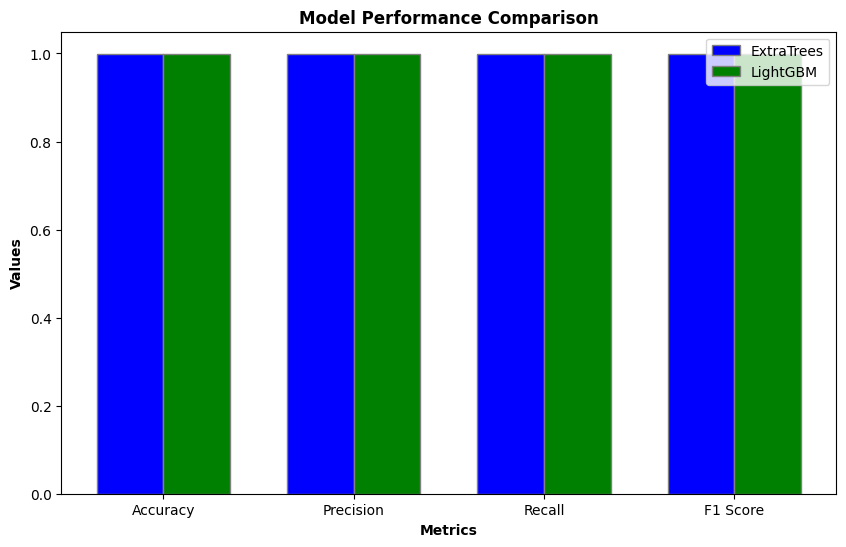

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data
models = ['ExtraTrees', 'LightGBM']
metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score']

# Values corresponding to each metric
extra_trees_values = [0.9994, 0.99940063, 0.9994, 0.99939718]
lightgbm_values = [0.9984, 0.99840465, 0.9984, 0.99838108]

# Bar width
bar_width = 0.35

# Position of bars on x-axis
r1 = np.arange(len(metrics))
r2 = [x + bar_width for x in r1]

# Plotting the bars
plt.figure(figsize=(10, 6))
plt.bar(r1, extra_trees_values, color='blue', width=bar_width, edgecolor='grey', label='ExtraTrees')
plt.bar(r2, lightgbm_values, color='green', width=bar_width, edgecolor='grey', label='LightGBM')

# Adding labels and title
plt.xlabel('Metrics', fontweight='bold')
plt.xticks([r + bar_width/2 for r in range(len(metrics))], metrics)
plt.ylabel('Values', fontweight='bold')
plt.title('Model Performance Comparison', fontweight='bold')

# Adding a legend
plt.legend()

# Show plot
plt.show()


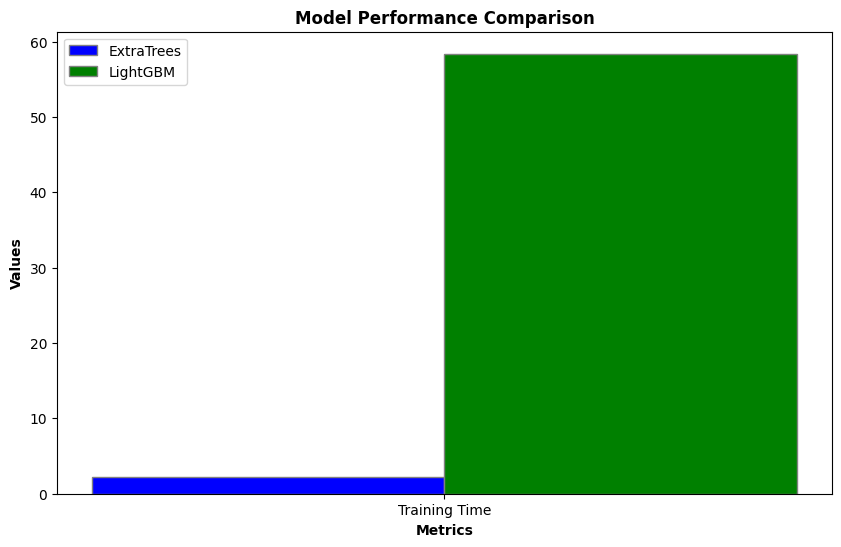

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data
models = ['ExtraTrees', 'LightGBM']
metrics = ['Training Time']

# Values corresponding to each metric
extra_trees_values = [2.24918652]
lightgbm_values = [58.3918874]

# Bar width
bar_width = 0.35

# Position of bars on x-axis
r1 = np.arange(len(metrics))
r2 = [x + bar_width for x in r1]

# Plotting the bars
plt.figure(figsize=(10, 6))
plt.bar(r1, extra_trees_values, color='blue', width=bar_width, edgecolor='grey', label='ExtraTrees')
plt.bar(r2, lightgbm_values, color='green', width=bar_width, edgecolor='grey', label='LightGBM')

# Adding labels and title
plt.xlabel('Metrics', fontweight='bold')
plt.xticks([r + bar_width/2 for r in range(len(metrics))], metrics)
plt.ylabel('Values', fontweight='bold')
plt.title('Model Performance Comparison', fontweight='bold')

# Adding a legend
plt.legend()

# Show plot
plt.show()


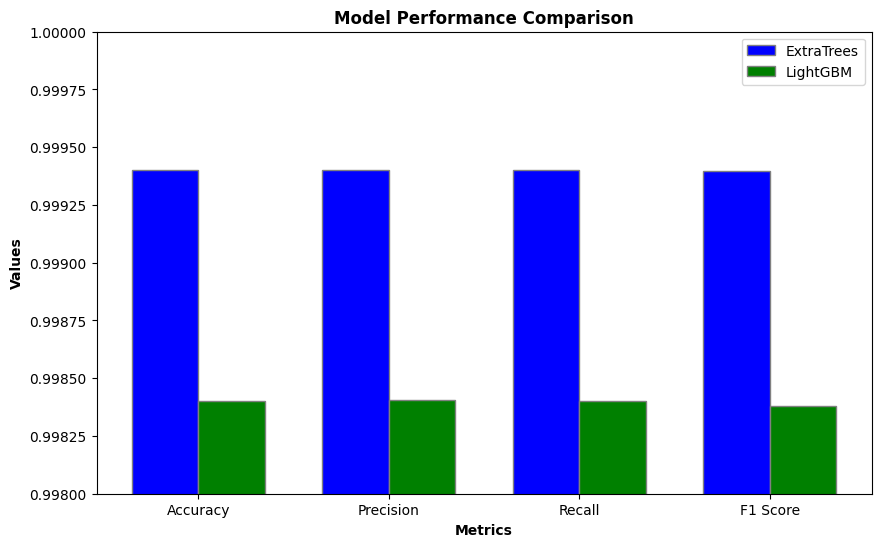

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data
models = ['ExtraTrees', 'LightGBM']
metrics = ['Accuracy', 'Precision', 'Recall', 'F1 Score']

# Values corresponding to each metric
extra_trees_values = [0.9994, 0.99940063, 0.9994, 0.99939718]
lightgbm_values = [0.9984, 0.99840465, 0.9984, 0.99838108]

# Bar width
bar_width = 0.35

# Position of bars on x-axis
r1 = np.arange(len(metrics))
r2 = [x + bar_width for x in r1]

# Plotting the bars
plt.figure(figsize=(10, 6))
plt.bar(r1, extra_trees_values, color='blue', width=bar_width, edgecolor='grey', label='ExtraTrees')
plt.bar(r2, lightgbm_values, color='green', width=bar_width, edgecolor='grey', label='LightGBM')

# Adding labels and title
plt.xlabel('Metrics', fontweight='bold')
plt.xticks([r + bar_width/2 for r in range(len(metrics))], metrics)
plt.ylabel('Values', fontweight='bold')
plt.title('Model Performance Comparison', fontweight='bold')

# Adjusting the y-axis limits
plt.ylim([0.998, 1.000])  # Focus on the range where values differ

# Adding a legend
plt.legend()

# Show plot
plt.show()
